
# **3. Regression Task**
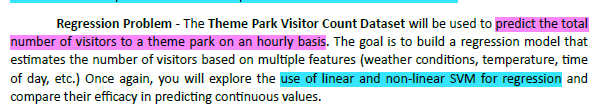

## **3.1 Dataset Overview**

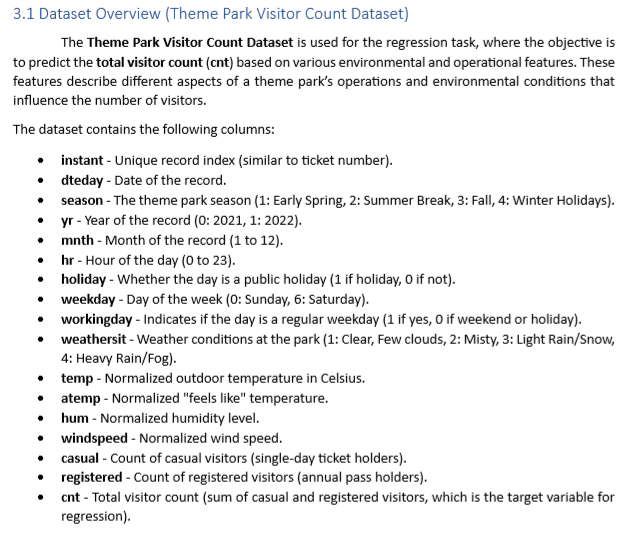

### Importing the essential libraries

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix
from matplotlib.colors import ListedColormap

# Plot styles to set aesthetic preferences for your visualizations.
sns.set()
plt.style.use('ggplot')

### Importing the dataset

In [ ]:
# mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Assignment 2/theme_park_visitor_count_dataset.csv')

In [ ]:
df

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01/01/2011,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,01/01/2011,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,01/01/2011,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,01/01/2011,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,01/01/2011,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,31/12/2012,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,31/12/2012,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,31/12/2012,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,31/12/2012,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


### Understanding the data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [ ]:
for column in df.columns:
  print(f"{column}: {df[column].nunique()}")


instant: 17379
dteday: 731
season: 4
yr: 2
mnth: 12
hr: 24
holiday: 2
weekday: 7
workingday: 2
weathersit: 4
temp: 50
atemp: 65
hum: 89
windspeed: 30
casual: 322
registered: 776
cnt: 869


In [ ]:
df.shape

(17379, 17)

### Dividing the columns into three categories


1.   **Numerical Data:**
      * instant
      * temp
      * atemp
      * hum
      * windspeed
      * casual
      * registered
      * cnt


2.   **Categorical Data:**
      * season
      * yr
      * mnth
      * hr
      * holiday
      * weekday
      * workingday
      * weathersit

3.   **Mixed Data:**
      * dteday



## **3.2 Data Exploration and Preprocessing**

### **3.2.1 Exploratory Data Analysis (EDA)**

####**Univariate Analysis**

Univariate analysis focuses on analyzing each feature in the dataset independently.



*   **Distribution analysis:** The distribution of each feature is examined to identify its shape, central tendency, and dispersion
*   **Identifying potential issues:** Univariate analysis helps in identifying potential problems with the data such as outliers, skewness and missing values



##### **Steps of doing Univariate Analysis on Numerical columns**

**Descriptive Statistics:** Compute basic summary statistics for the column, such as mean, median, mode, standard deviation, range, and quartiles. These statistics give a general understanding of the distribution of the data and can help identify skewness or outliers.

**Visualizations:** Create visualizations to explore the distribution of the data. Some common visualizations for numerical data include histograms, box plots, and density plots. These visualizations provide a visual representation of the distribution of the data and can help identify skewness an outliers.

**Data Imbalances**

**Identifying Outliers:** Identify and examine any outliers in the data. Outliers can be identified using visualizations. It is important to determine whether the outliers are due to measurement errors, data entry errors, or legitimate differences in the data, and to decide whether to include or exclude them from the analysis.

**Skewness:** Check for skewness in the data and consider transforming the data or using robust statistical methods that are less sensitive to skewness, if necessary.

**Conclusion:** Summarize the findings of the EDA and make decisions about how to proceed with further analysis.

##### **Numerical Variables**

**Automation Function for Univariate Analysis Of Numerical Features**

In [ ]:
def analyze_feature(df, feature):
    # Statistical summary and skewness
    stats = df[feature].describe()
    skewness = df[feature].skew()
    missing_values = df[feature].isnull().sum()  # Calculate missing values

    # Set up a canvas for plotting
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))

    # Histogram
    axs[0, 0].hist(df[feature].dropna(), bins=20, color='skyblue', edgecolor='black')  # Exclude missing values
    axs[0, 0].set_title(f'Histogram of {feature}')
    axs[0, 0].set_xlabel(feature)
    axs[0, 0].set_ylabel('Frequency')

    # KDE Plot
    sns.kdeplot(df[feature].dropna(), ax=axs[0, 1], color='purple', fill=True)  # Exclude missing values
    axs[0, 1].set_title(f'KDE Plot of {feature}')
    axs[0, 1].set_xlabel(feature)
    axs[0, 1].set_ylabel('Density')

    # Boxplot
    sns.boxplot(x=df[feature], ax=axs[1, 0], color='lightgreen')
    axs[1, 0].set_title(f'Boxplot of {feature}')
    axs[1, 0].set_xlabel(feature)

    # Key Metrics
    axs[1, 1].axis('off')  # Turn off the axis
    textstr = (
        f"### Key Metrics ###\n\n"
        f"{stats.to_string()}\n\n"
        f"Skewness: {skewness:.2f}\n"
        f"Missing Values: {missing_values}"
    )
    axs[1, 1].text(
        0.5, 0.5, textstr, fontsize=12, ha='center', va='center',
        bbox=dict(boxstyle="round", facecolor="lightgrey")
    )

    # Adjust layout
    plt.tight_layout()
    plt.show()


###### **instant**

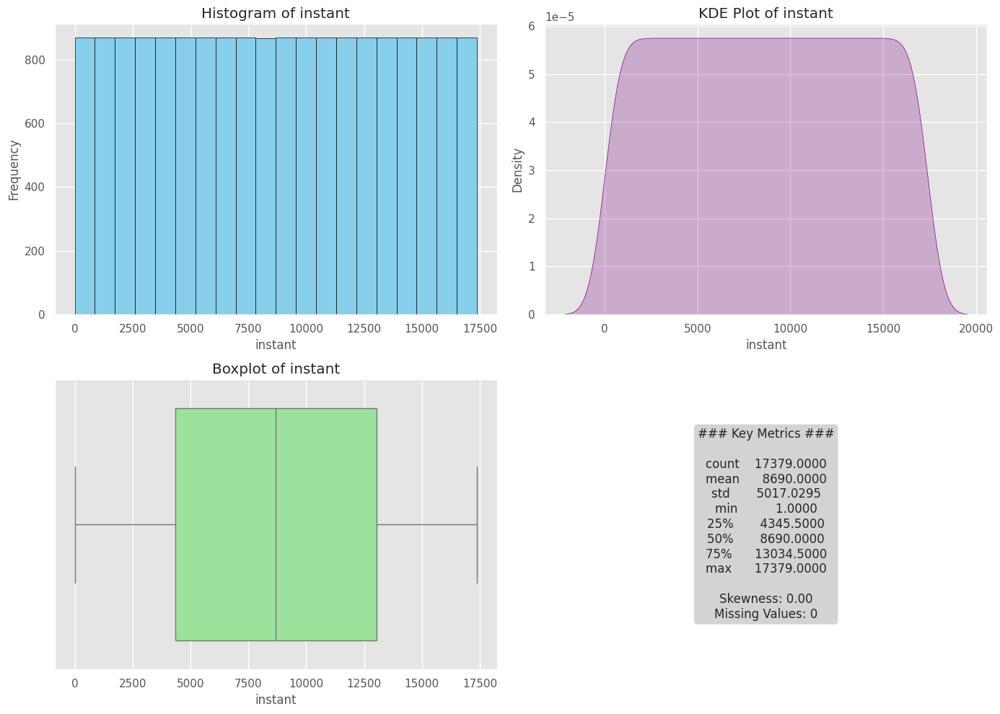

In [ ]:
analyze_feature(df, 'instant')

**Dropping This Column**


**It is just showing the number of tickets. It is not playing any part in the prediction of the number or count of the visitors visiting the park in a day.**

In [ ]:
df.shape

(17379, 17)

In [ ]:
df.drop('instant', axis=1, inplace=True)

In [ ]:
df.shape

(17379, 16)

###### **temp**

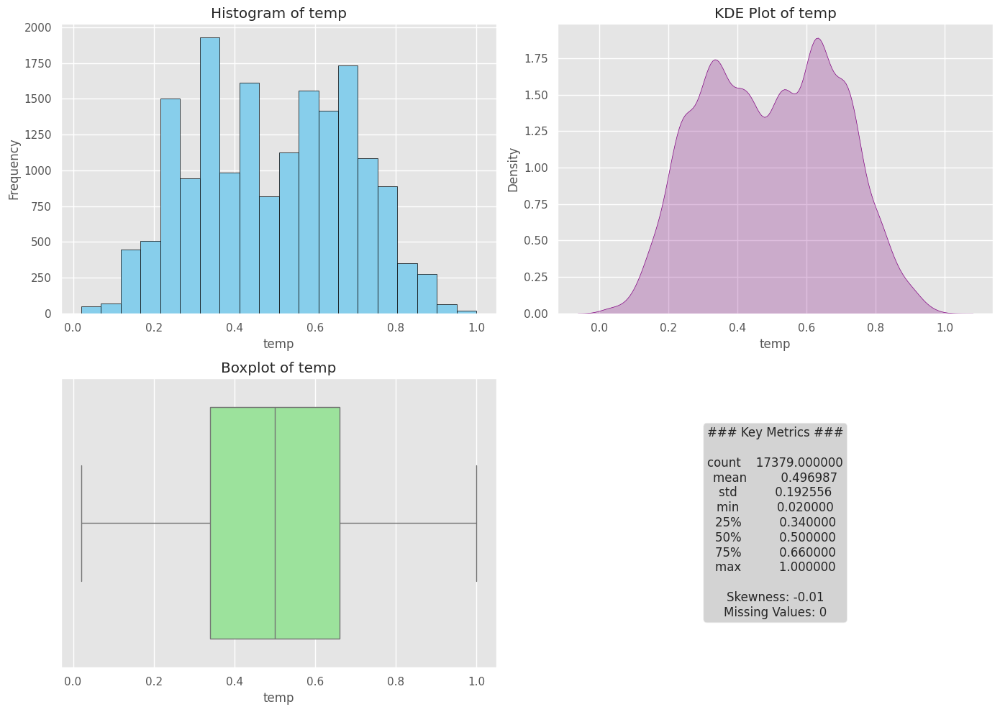

In [ ]:
analyze_feature(df, 'temp')

###### **atemp**

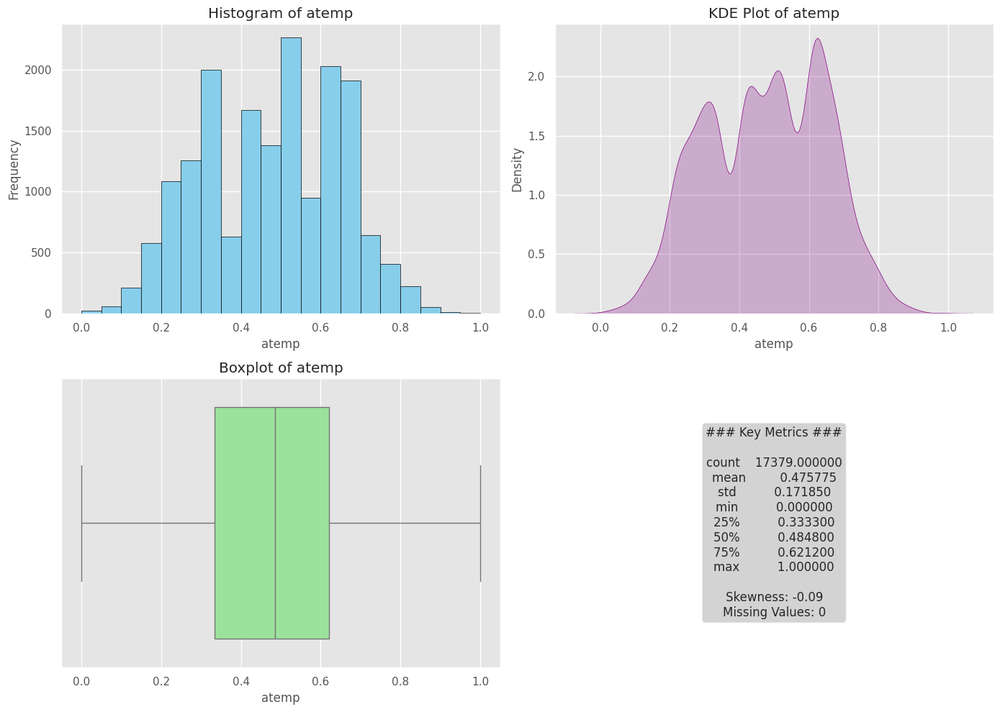

In [ ]:
analyze_feature(df, 'atemp')

###### **hum**

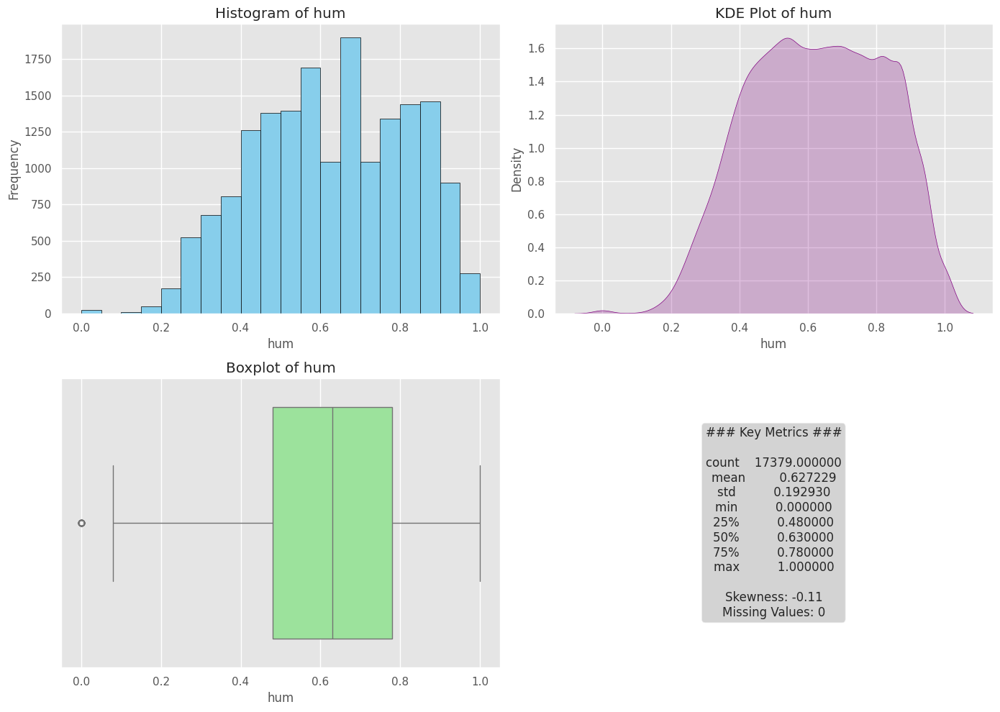

In [ ]:
analyze_feature(df, 'hum')

###### **windspeed**

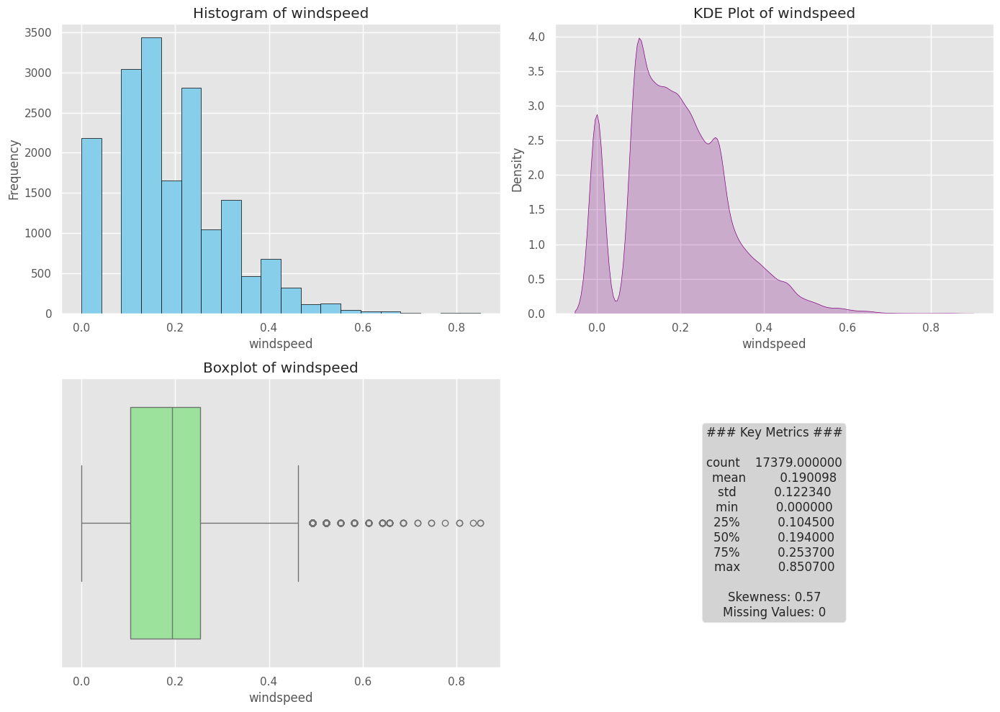

In [ ]:
analyze_feature(df, 'windspeed')

###### **casual**

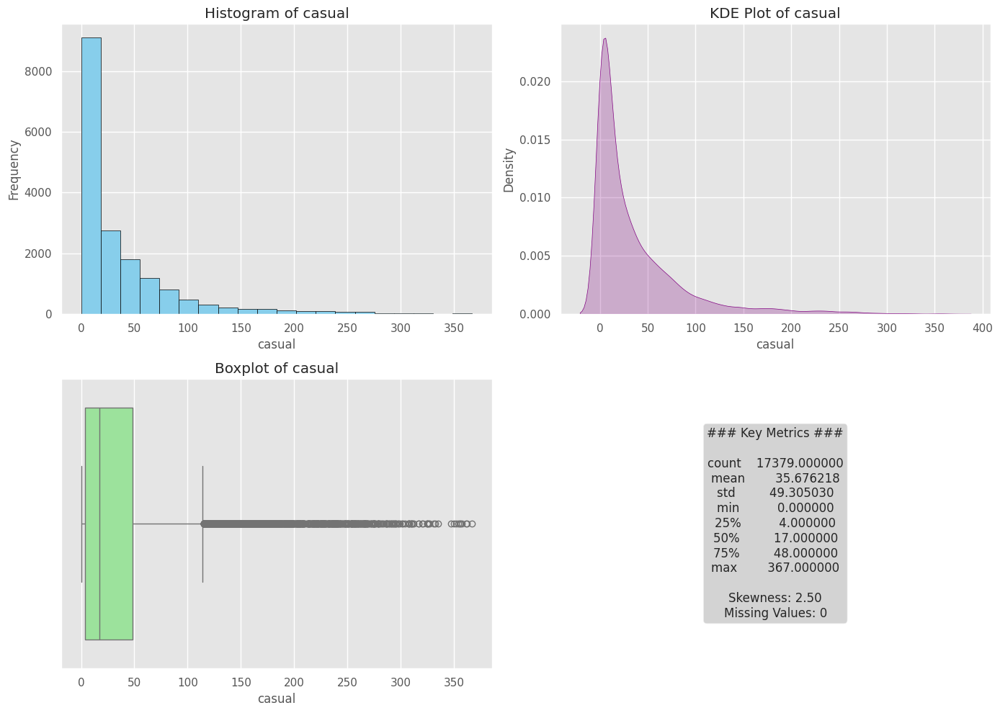

In [ ]:
analyze_feature(df, 'casual')

###### **registered**

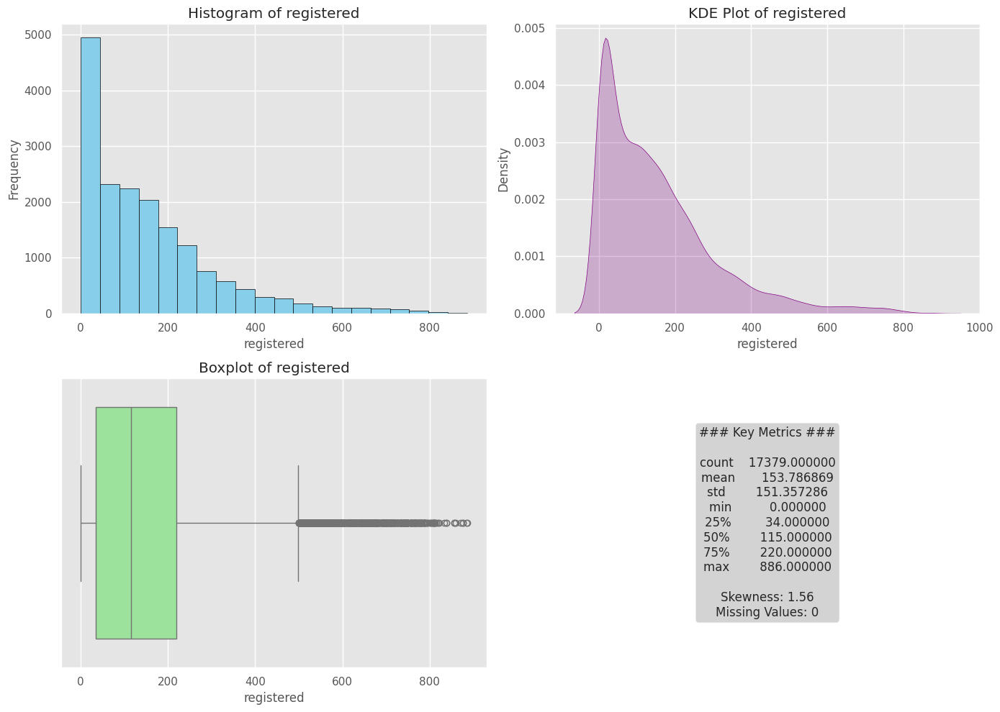

In [ ]:
analyze_feature(df, 'registered')

###### **cnt**

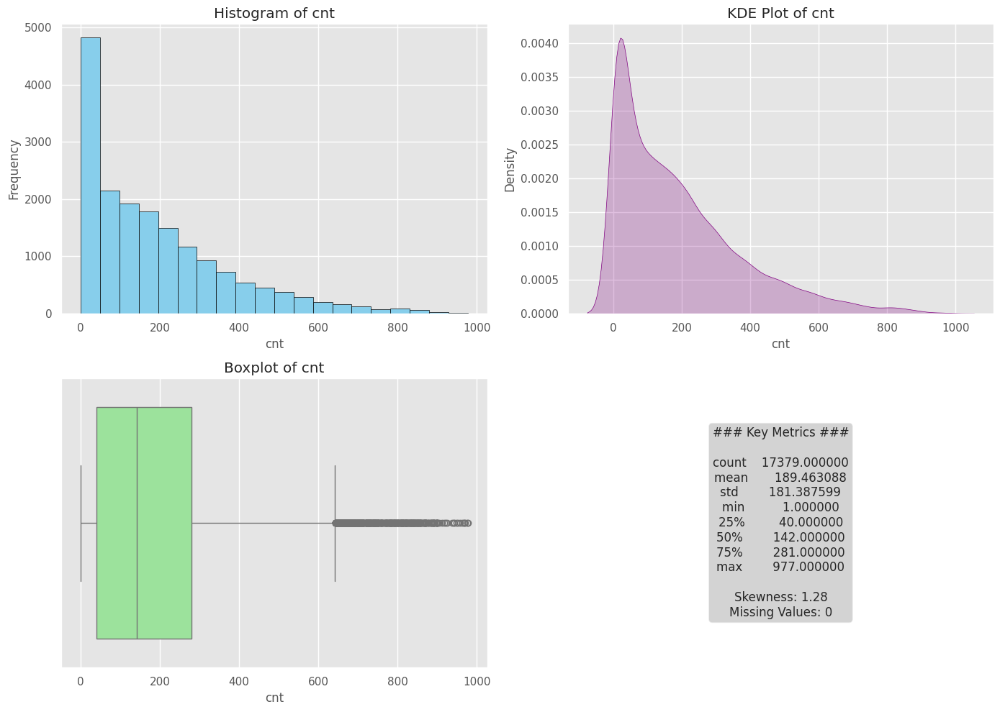

In [ ]:
analyze_feature(df, 'cnt')

###### **Interpretation From Univariate Analysis Of Numerical Features**

Individual Summary Table for each variable is shown in its output.
temp, atemp, hum and windspeed are normal but casual, registered and cnt are positively skewed.

##### **Categorical Variables**

**Automation Function for Univariate Analysis Of Categorical Features**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_categorical_variable(df, column):
    """
    Perform univariate analysis for a categorical variable in a presentable manner.

    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
        column (str): The column name of the categorical variable to analyze.
    """
    # Value counts
    value_counts = df[column].value_counts()
    missing_values = df[column].isnull().sum()

    # Set up subplots for bar and pie charts
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Bar Plot
    value_counts.plot(kind='bar', color='skyblue', ax=axs[0])
    axs[0].set_title(f'Bar Plot of {column}', fontsize=14)
    axs[0].set_xlabel(column, fontsize=12)
    axs[0].set_ylabel('Frequency', fontsize=12)

    # Pie Chart
    value_counts.plot(kind='pie', autopct='%1.1f%%', colors=['red', 'green', 'yellow', 'orange', 'skyblue', 'violet', 'pink', 'purple', 'lightgrey', 'brown', 'grey', 'lightgreen'], ax=axs[1])
    axs[1].set_title(f'Pie Chart of {column}', fontsize=14)
    axs[1].set_ylabel('')  # Remove y-label for the pie chart

    # Summary Box
    axs[2].axis('off')  # Turn off the axis
    summary_text = f"### Analysis of '{column}' ###\n\n"
    summary_text += "Value Counts:\n"
    summary_text += "\n".join([f"{index}: {value}" for index, value in value_counts.items()])
    summary_text += f"\n\nMissing Values: {missing_values}"
    axs[2].text(0.5, 0.5, summary_text, fontsize=12, ha='center', va='center',
                bbox=dict(boxstyle="round", facecolor="lightgrey"))

    # Adjust layout
    plt.tight_layout()
    plt.show()


###### **season**

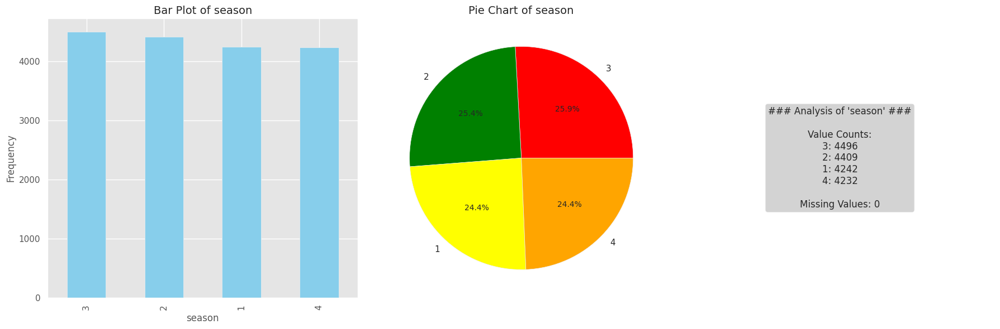

In [ ]:
analyze_categorical_variable(df, 'season')

###### **yr**

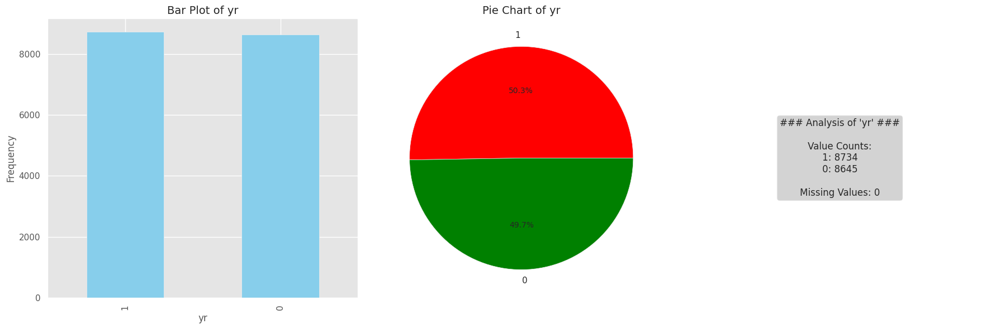

In [ ]:
analyze_categorical_variable(df, 'yr')

###### **mnth**

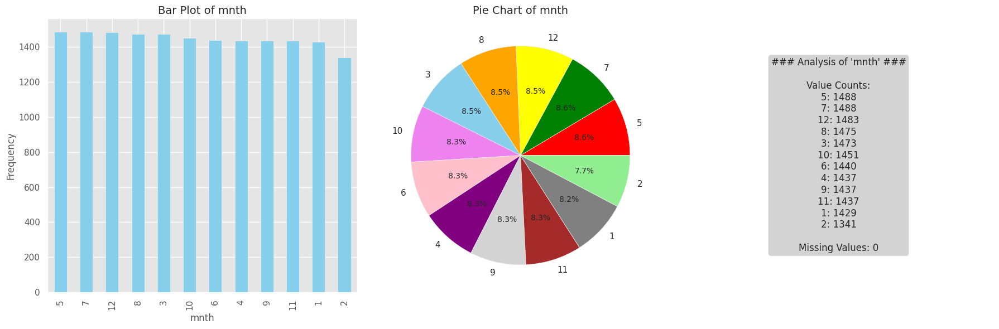

In [ ]:
analyze_categorical_variable(df, 'mnth')

###### **hr**

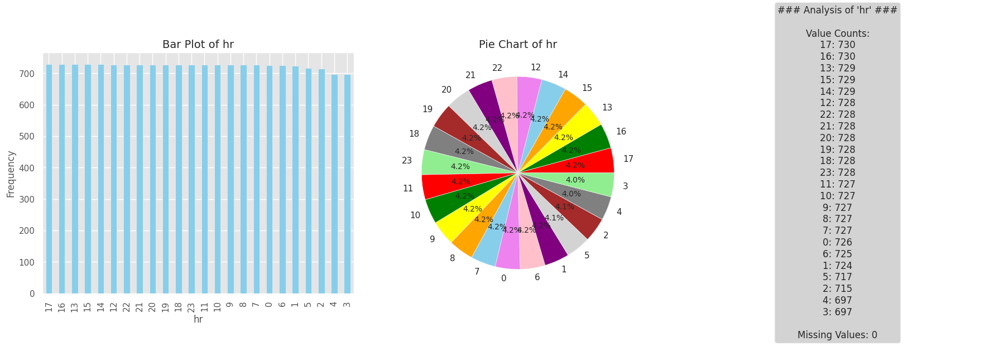

In [ ]:
analyze_categorical_variable(df, 'hr')

###### **holiday**

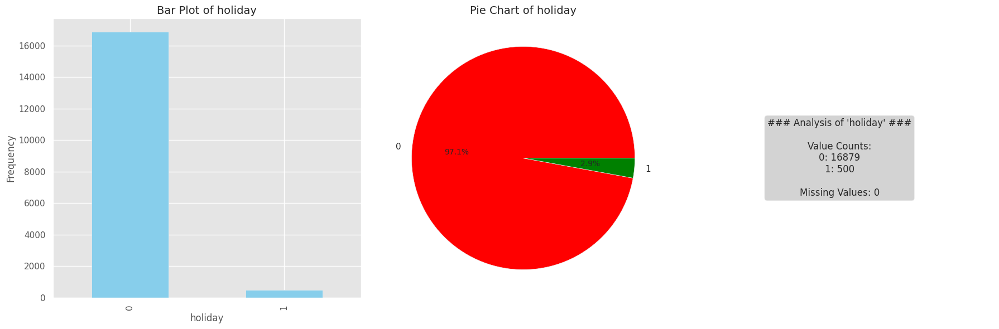

In [ ]:
analyze_categorical_variable(df, 'holiday')

###### **weekday**

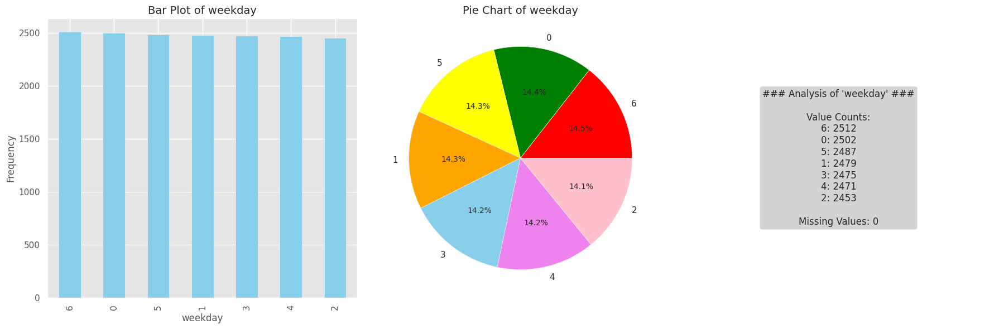

In [ ]:
analyze_categorical_variable(df, 'weekday')

###### **workingday**

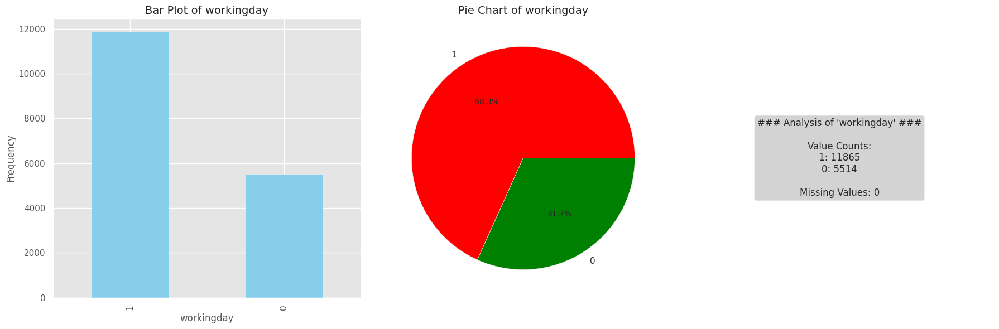

In [ ]:
analyze_categorical_variable(df, 'workingday')

###### **weathersit**

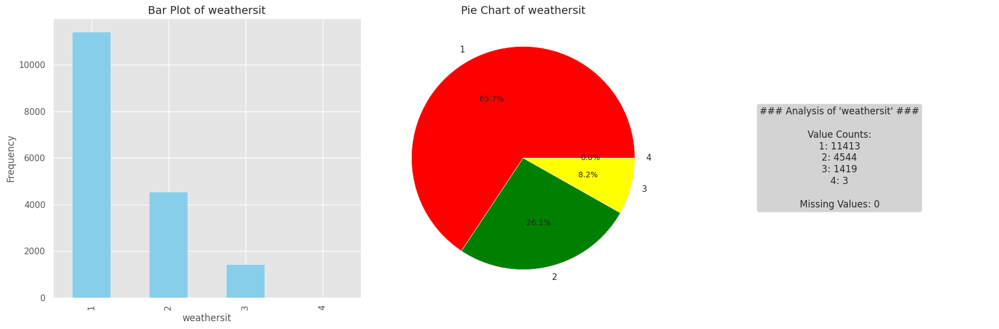

In [ ]:
analyze_categorical_variable(df, 'weathersit')

#### **Bivariate Analysis**


##### **Steps of doing Bivariate Analysis**

- Select 2 cols
- Understand type of relationship
    1. **Numerical - Numerical**<br>
        a. You can plot graphs like scatterplot(regression plots), 2D histplot, 2D KDEplots<br>
        b. Check correlation coefficent to check linear relationship
    2. **Numerical - Categorical** - create visualizations that compare the distribution of the numerical data across different categories of the categorical data.<br>
        a. You can plot graphs like barplot, boxplot, kdeplot violinplot even scatterplots. Scatterplots are not as much beneficial<br>
    3. **Categorical - Categorical**<br>
        a. You can create cross-tabulations or contingency tables that show the distribution of values in one categorical column, grouped by the values in the other categorical column.<br>
        b. You can plots like heatmap, stacked barplots, treemaps


##### **First Type: Numerical-Numerical**

**Function For Bivariate Analysis of Numerical-Numerical Combination Of Features**

In [ ]:

def bivariate_analysis_numerical_numerical(df, feature1, feature2):
    """
    Perform bivariate analysis between two numerical features, displaying only
    the scatter plot and the correlation coefficient, with different colors for each feature.

    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
        feature1 (str): The column name of the first numerical feature.
        feature2 (str): The column name of the second numerical feature.
    """
    # Calculate correlation coefficient
    correlation_coefficient = df[[feature1, feature2]].corr().iloc[0, 1]

    # Set up a canvas for plotting with a smaller figure size
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Define unique colors for the features
    feature1_color = 'skyblue'
    feature2_color = 'orange'

    # Scatter Plot with Regression Line and Different Colors
    sns.regplot(x=feature1, y=feature2, data=df, ax=axs[0], scatter_kws={'alpha': 0.6, 'color': feature1_color}, line_kws={'color': feature2_color})
    axs[0].set_title(f'Scatterplot with Regression: {feature1} vs {feature2}', fontsize=14)
    axs[0].set_xlabel(feature1, fontsize=12)
    axs[0].set_ylabel(feature2, fontsize=12)

    # Display Correlation Coefficient with different color text
    axs[1].axis('off')  # Turn off the axis
    textstr = f"### Correlation Analysis ###\n\nCorrelation Coefficient: {correlation_coefficient:.2f}"
    axs[1].text(0.5, 0.5, textstr, fontsize=14, ha='center', va='center', bbox=dict(boxstyle="round", facecolor="lightgreen"))

    # Adjust layout
    plt.tight_layout()
    plt.show()


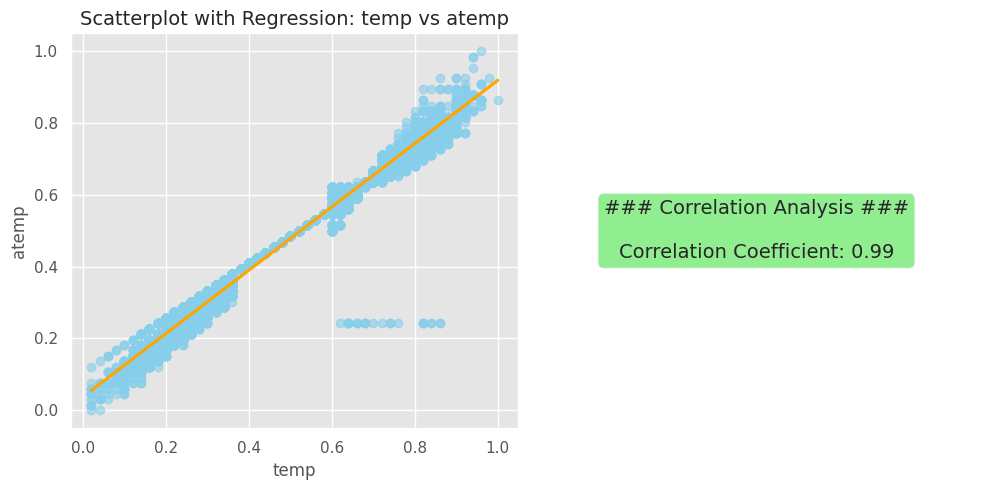

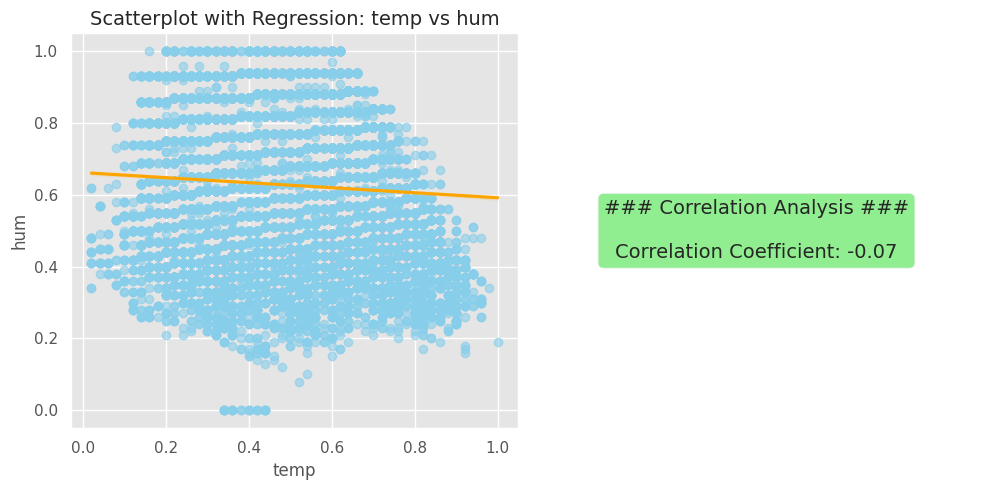

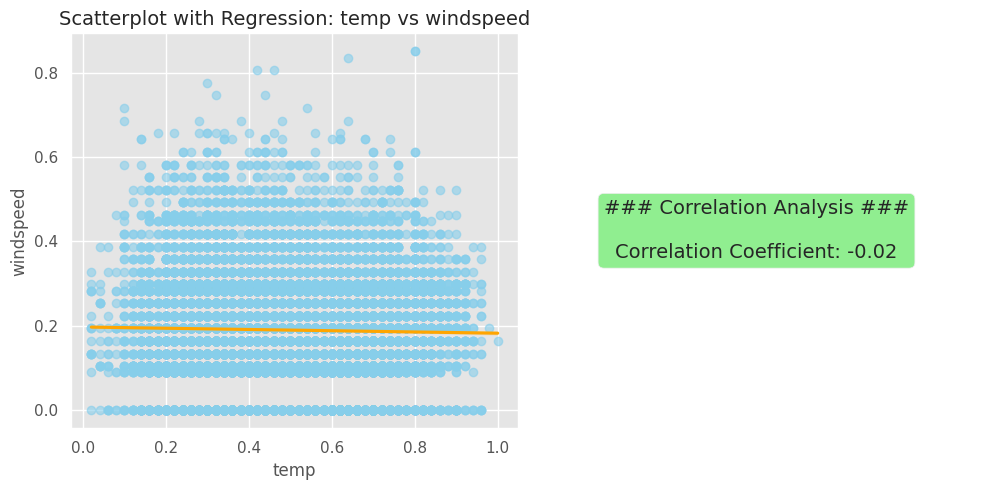

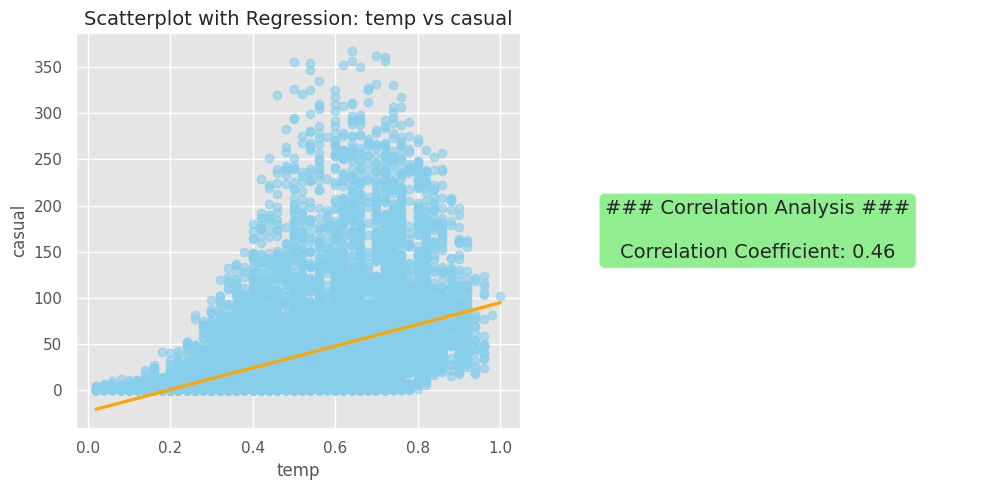

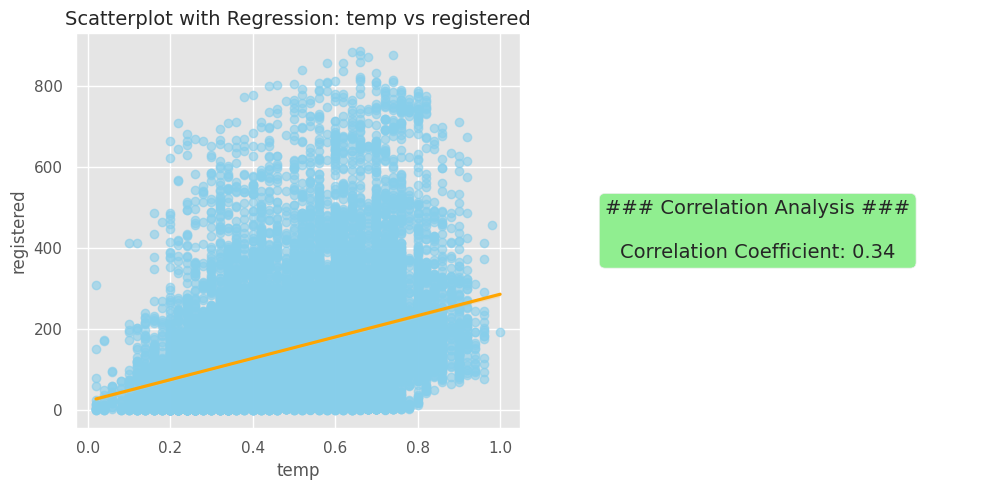

...

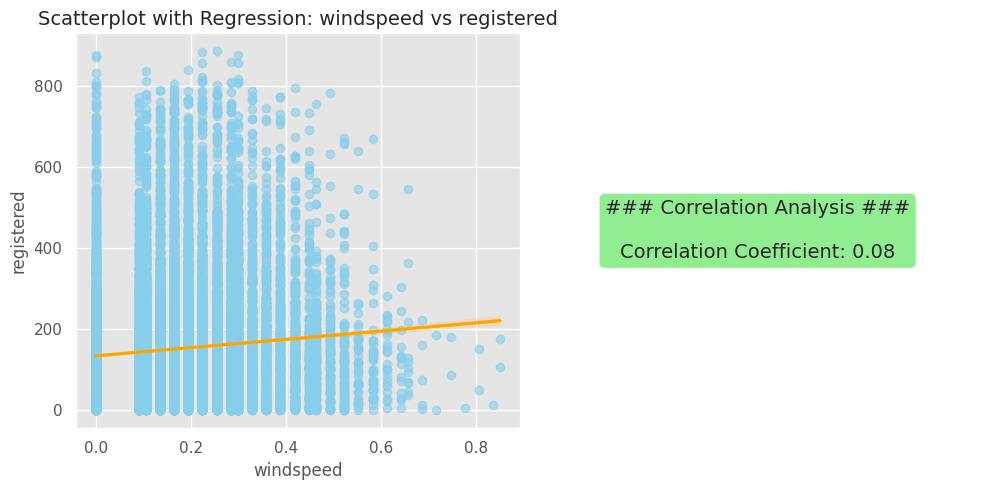

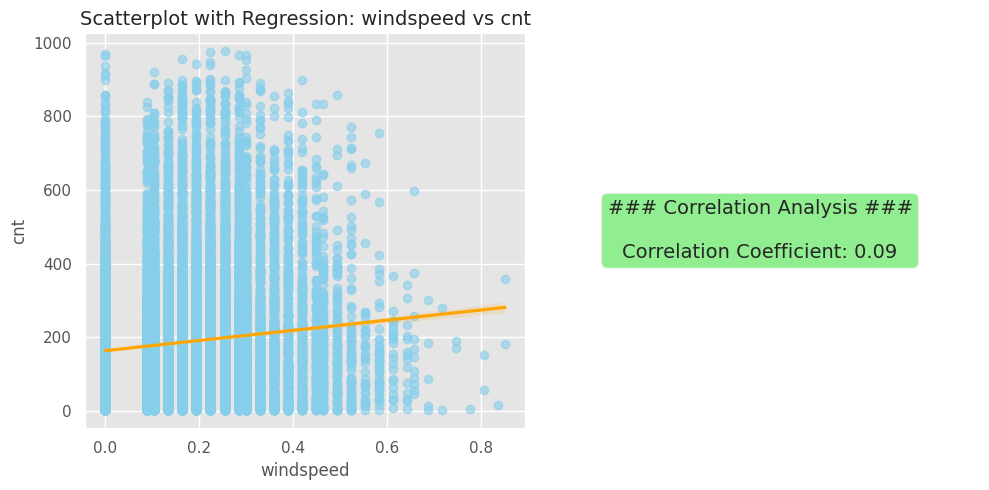

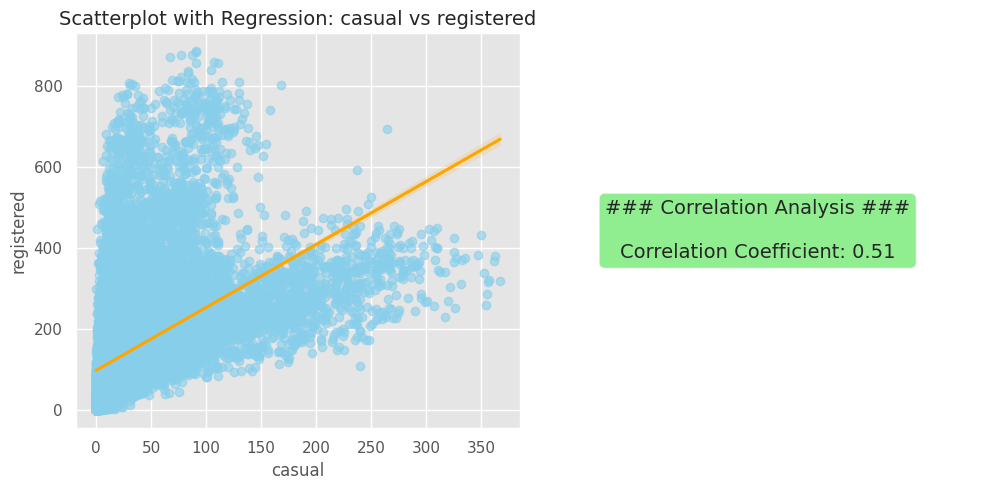

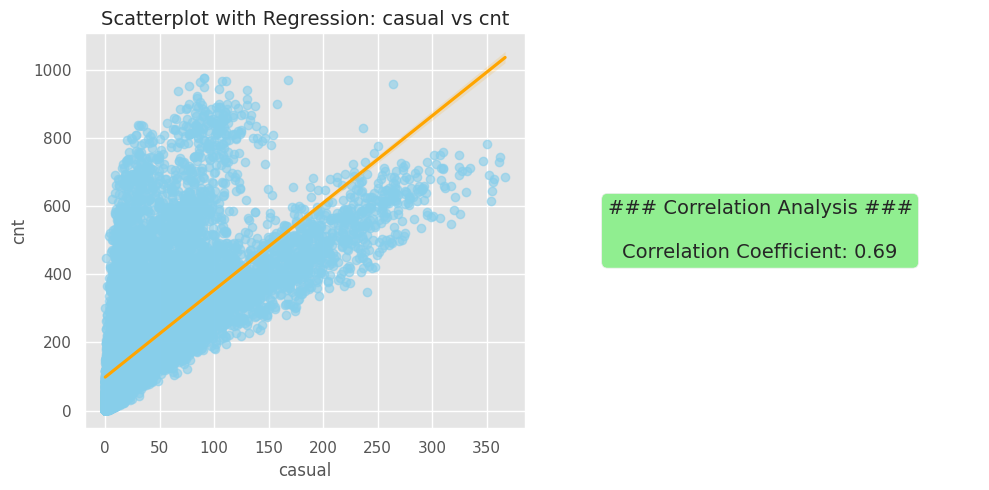

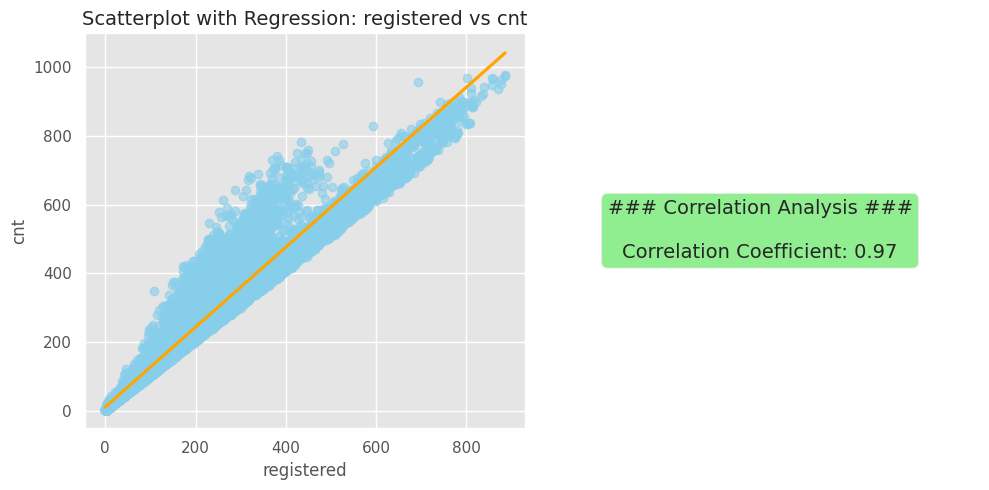

In [ ]:
# List of numerical features
numerical_features = [
    'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt'
]

# Loop through all pairs of numerical features and call the analysis function
for i in range(len(numerical_features)):
    for j in range(i + 1, len(numerical_features)):
        feature1 = numerical_features[i]
        feature2 = numerical_features[j]
        bivariate_analysis_numerical_numerical(df, feature1, feature2)


##### **Second Type: Numerical-Categorical**

**Funtion For Bivariate Analysis of Numerical- Categorical Combination Of Features**

In [ ]:
def bivariate_analysis_numerical_categorical(df, numerical_feature, categorical_feature):
    """
    Perform bivariate analysis between a numerical feature and a categorical feature.

    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
        numerical_feature (str): The column name of the numerical feature.
        categorical_feature (str): The column name of the categorical feature.
    """
    # Set up a canvas for plotting
    fig, axs = plt.subplots(3, 1, figsize=(14, 16))  # 3 rows, 1 column layout

    # Bar Plot
    sns.barplot(x=categorical_feature, y=numerical_feature, data=df, ax=axs[0], ci=None, palette='Set2')
    axs[0].set_title(f'Bar Plot: {numerical_feature} by {categorical_feature}', fontsize=14)
    axs[0].set_xlabel(categorical_feature, fontsize=12)
    axs[0].set_ylabel(numerical_feature, fontsize=12)

    # Box Plot
    sns.boxplot(x=categorical_feature, y=numerical_feature, data=df, ax=axs[1], palette='Set3')
    axs[1].set_title(f'Box Plot: {numerical_feature} by {categorical_feature}', fontsize=14)
    axs[1].set_xlabel(categorical_feature, fontsize=12)
    axs[1].set_ylabel(numerical_feature, fontsize=12)

    # KDE Plot
    for category in df[categorical_feature].dropna().unique():
        subset = df[df[categorical_feature] == category]
        sns.kdeplot(subset[numerical_feature], ax=axs[2], label=str(category), fill=True)
    axs[2].set_title(f'KDE Plot: {numerical_feature} by {categorical_feature}', fontsize=14)
    axs[2].set_xlabel(numerical_feature, fontsize=12)
    axs[2].set_ylabel('Density', fontsize=12)
    axs[2].legend(title=categorical_feature)

    # Adjust layout
    plt.tight_layout()
    plt.show()


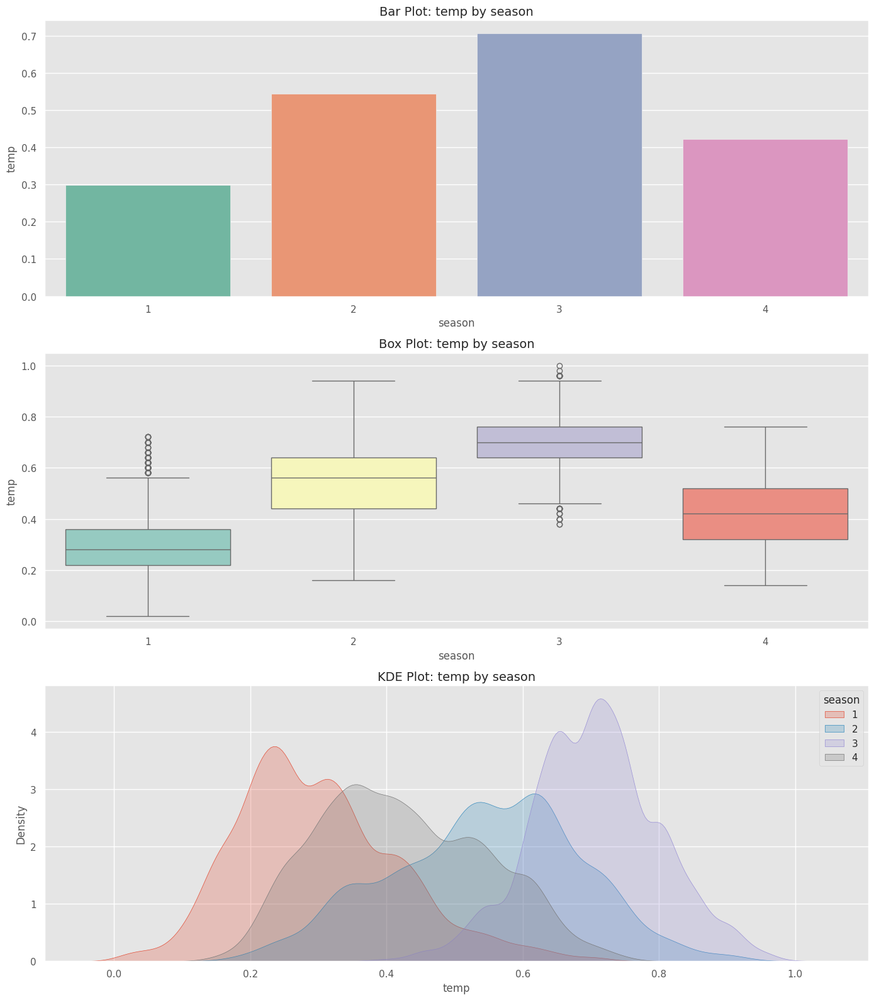

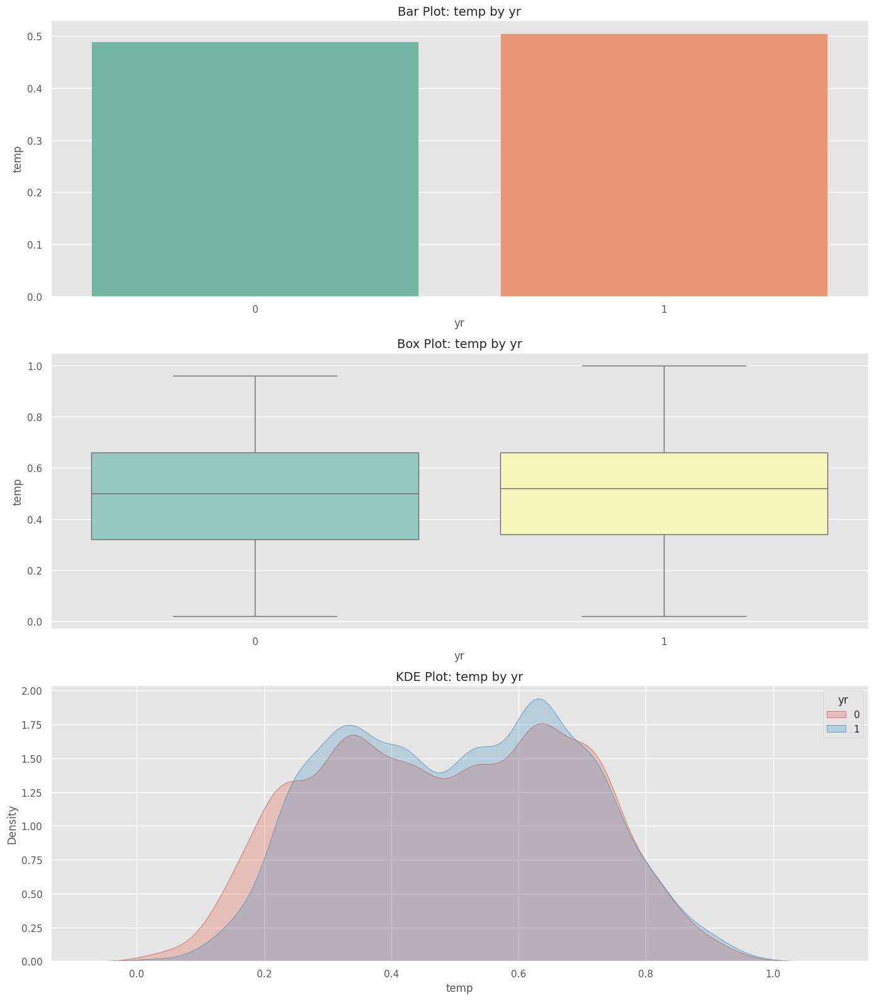

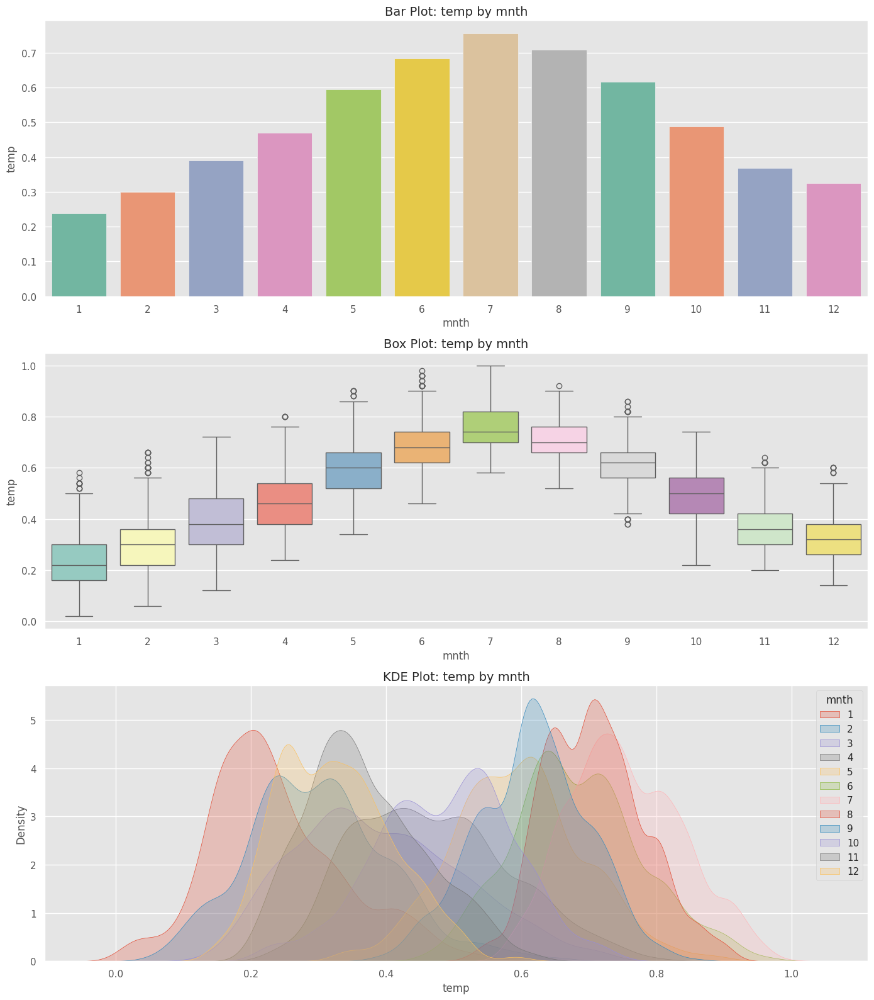

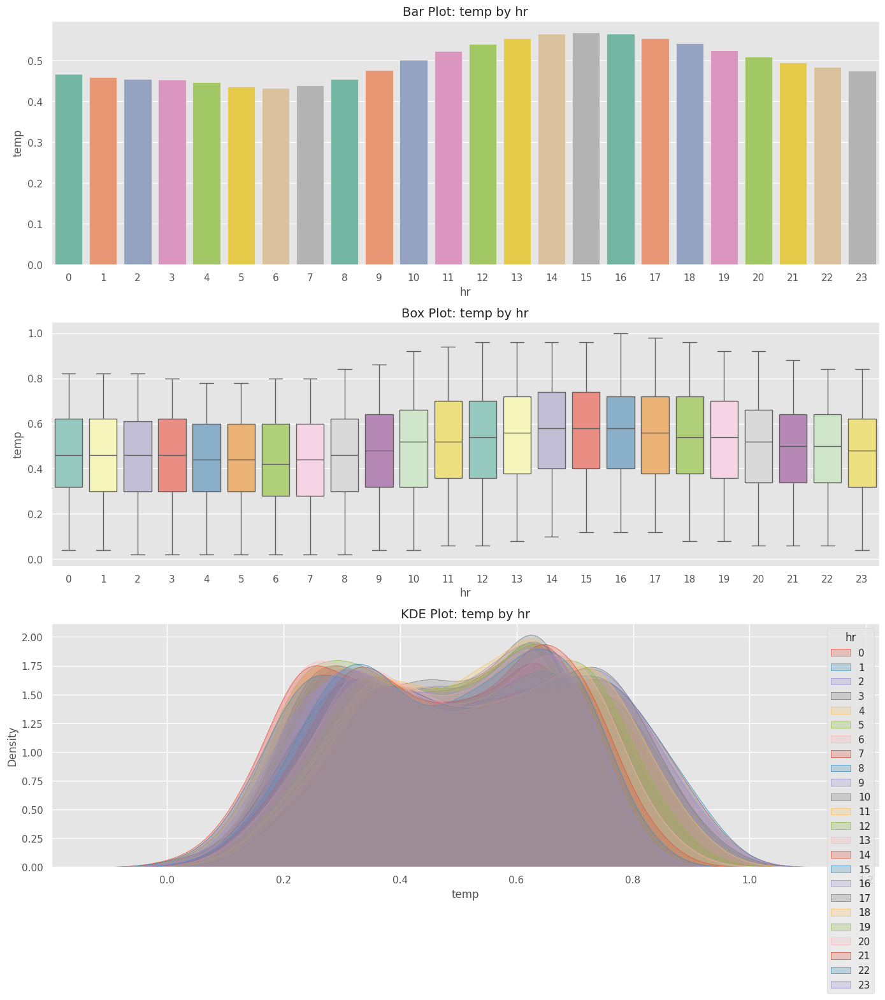

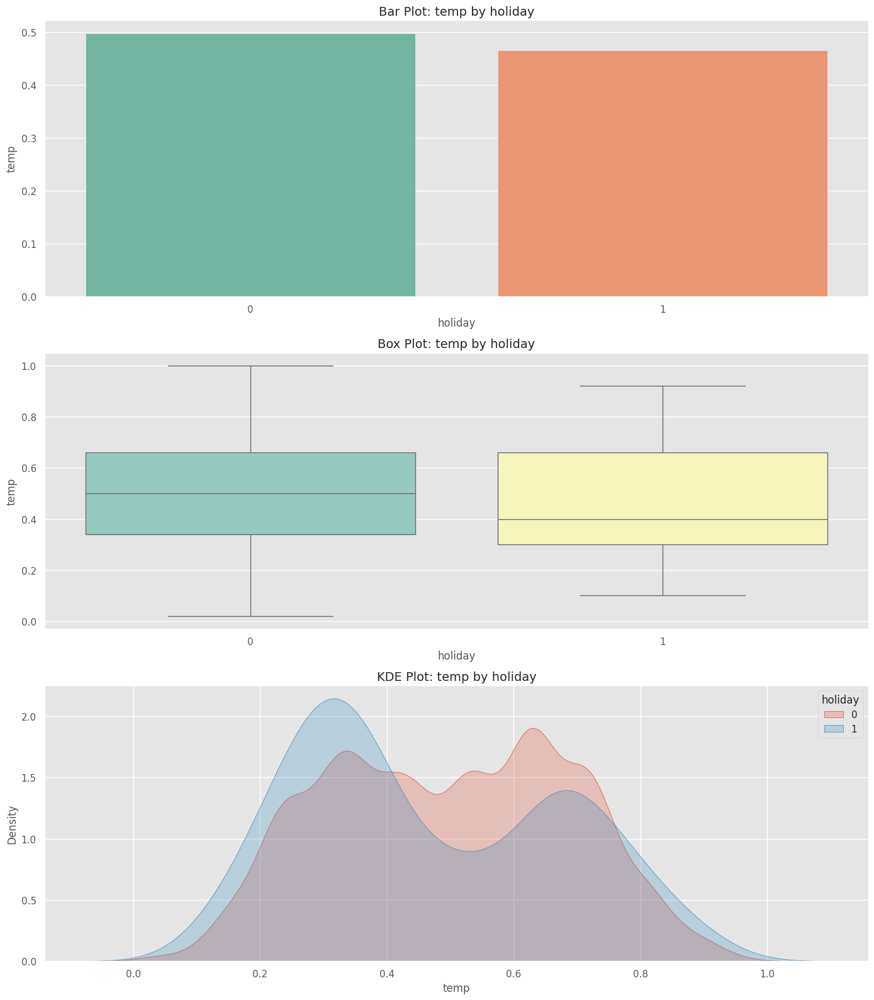

...

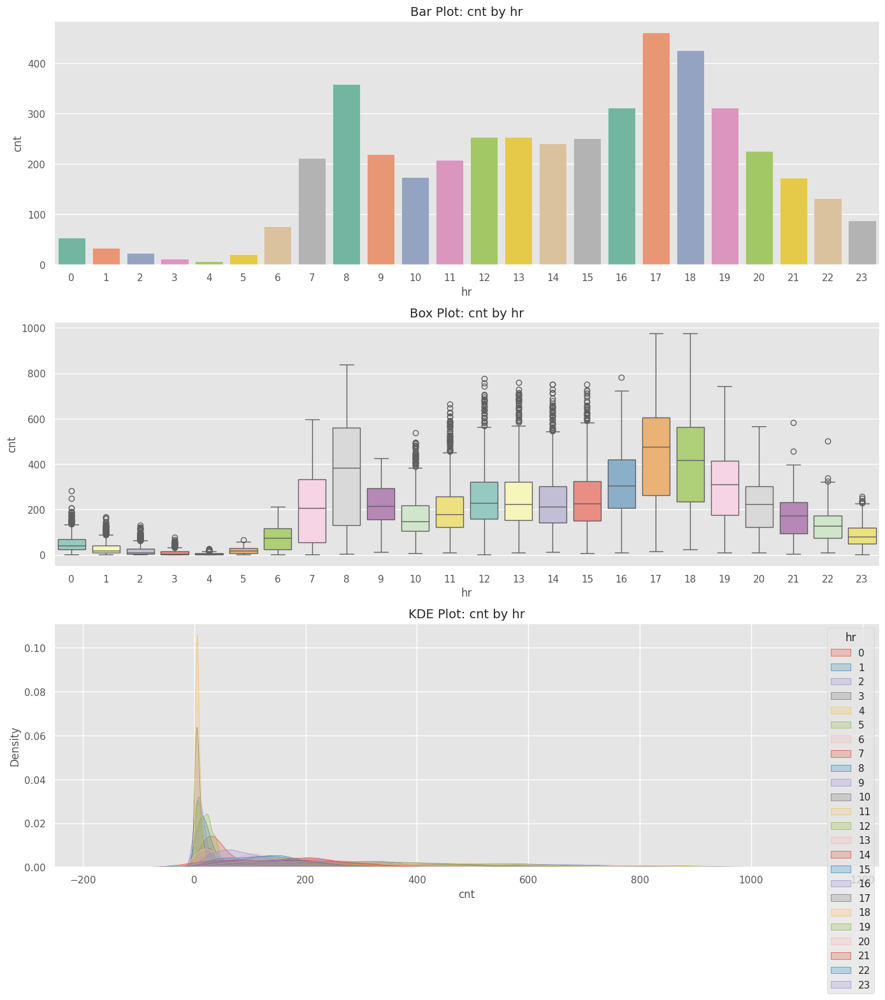

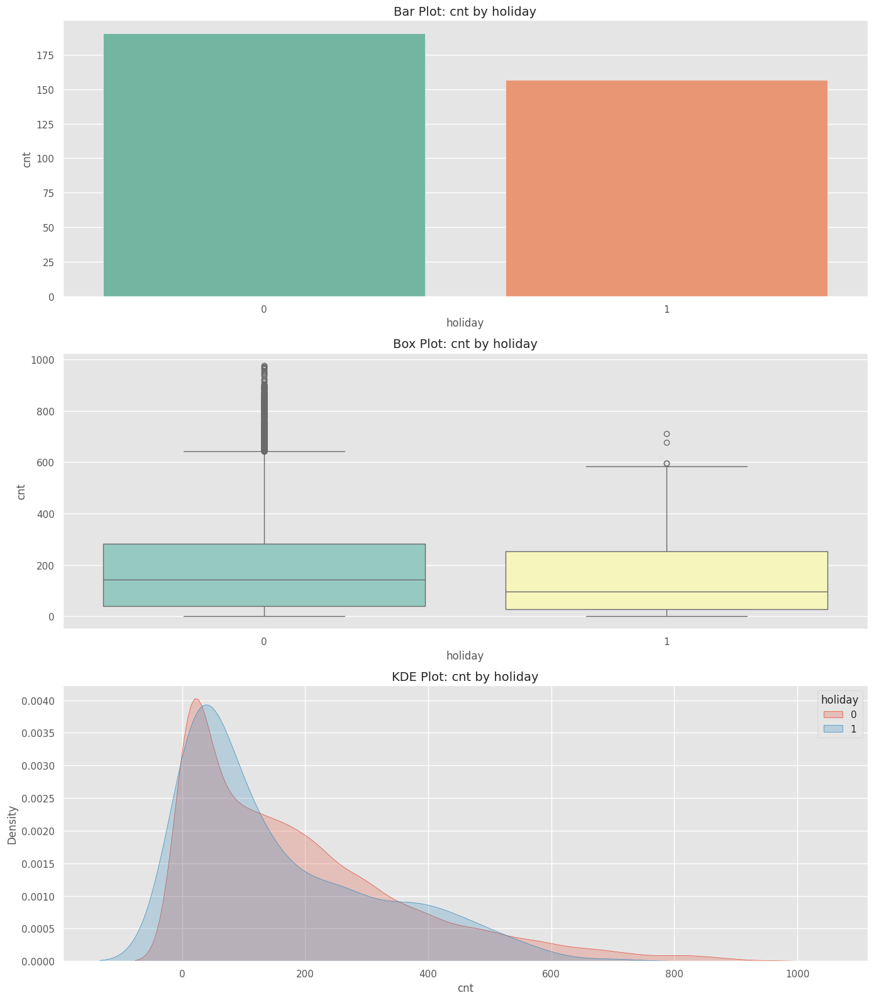

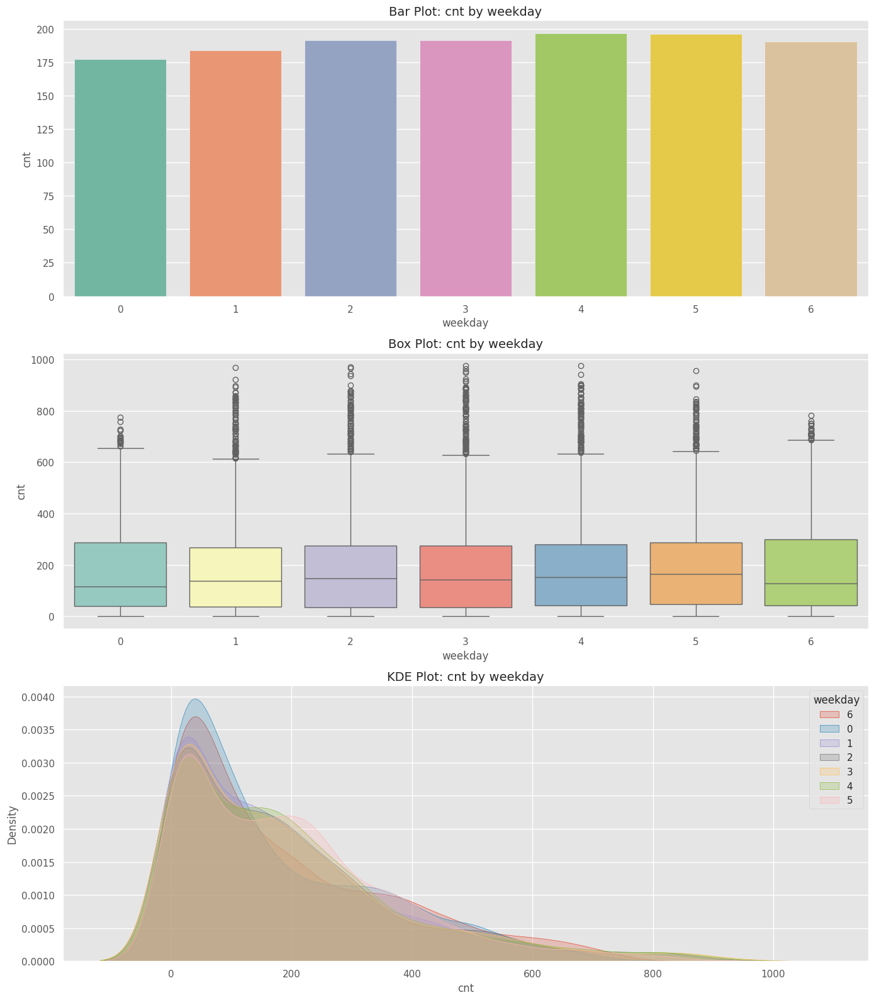

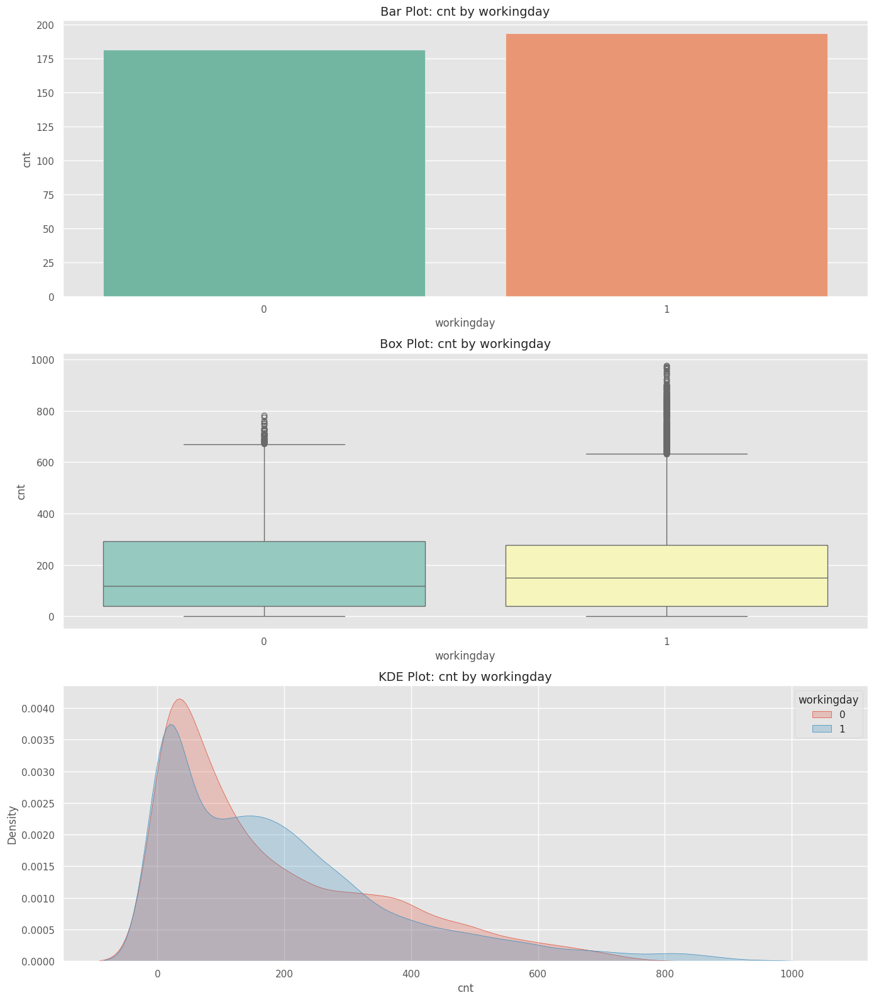

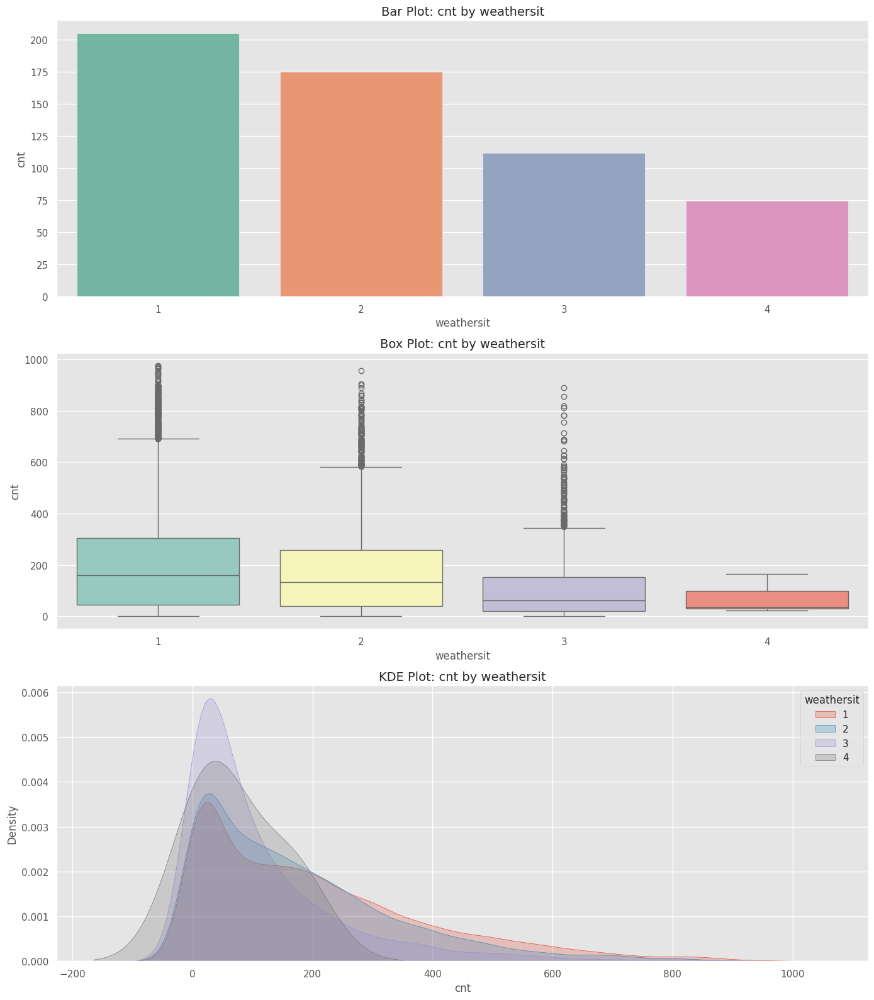

In [ ]:
# ignore warninigs
import warnings
warnings.filterwarnings('ignore')

# plotting numerical variables with categorical
numerical_features = [
    'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt'
]
categorical_features = [
    'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit'
]

for numerical_feature in numerical_features:
    for categorical_feature in categorical_features:
        bivariate_analysis_numerical_categorical(df, numerical_feature, categorical_feature)

##### **Third Type: Categorical-Categoricals**

**Function for categorical-categorical variable analysis**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def bivariate_categorical_analysis(df, var1, var2):
    """
    Perform bivariate analysis between two categorical variables.

    Parameters:
    df (pd.DataFrame): The dataframe containing the data.
    var1 (str): The first categorical variable (rows in crosstab).
    var2 (str): The second categorical variable (columns in crosstab).

    Returns:
    None: Displays the cross-tabulation table, normalized cross-tabulation, and heatmap.
    """
    # Create a cross-tabulation table
    crosstab = pd.crosstab(df[var1], df[var2])
    # print(f"Cross Tabulation between '{var1}' and '{var2}':\n")
    # print(crosstab)
    # print("\n" + "-"*50 + "\n")

    # Create normalized cross-tabulation table (percentage)
    crosstab_normalized = pd.crosstab(df[var1], df[var2], normalize='columns') * 100
    # print(f"Normalized Cross Tabulation (Percentage) between '{var1}' and '{var2}':\n")
    # print(crosstab_normalized)
    # print("\n" + "-"*50 + "\n")

    # Plot a heatmap for the normalized cross-tabulation
    plt.figure(figsize=(16, 6))
    sns.heatmap(crosstab_normalized, annot=True, fmt=".2f", cmap="Blues", cbar=True)
    plt.title(f'Heatmap of {var1} vs {var2}')
    plt.xlabel(var2)
    plt.ylabel(var1)
    plt.show()


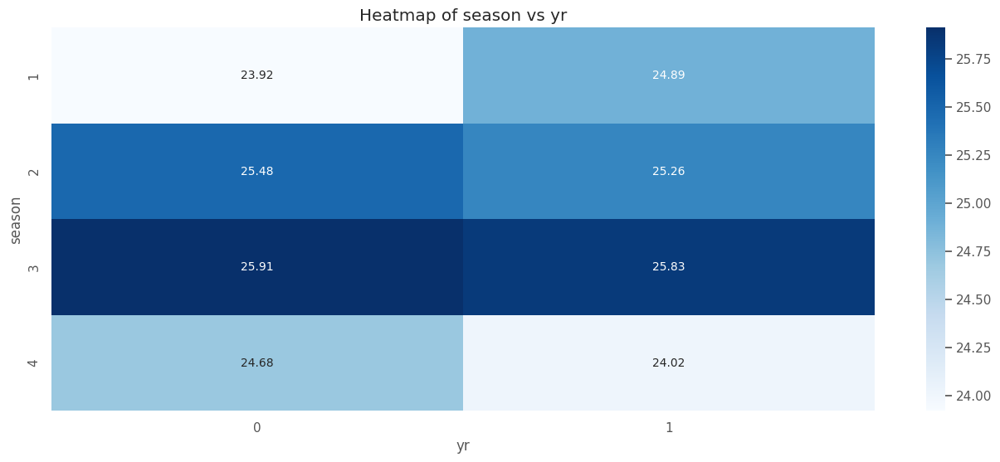

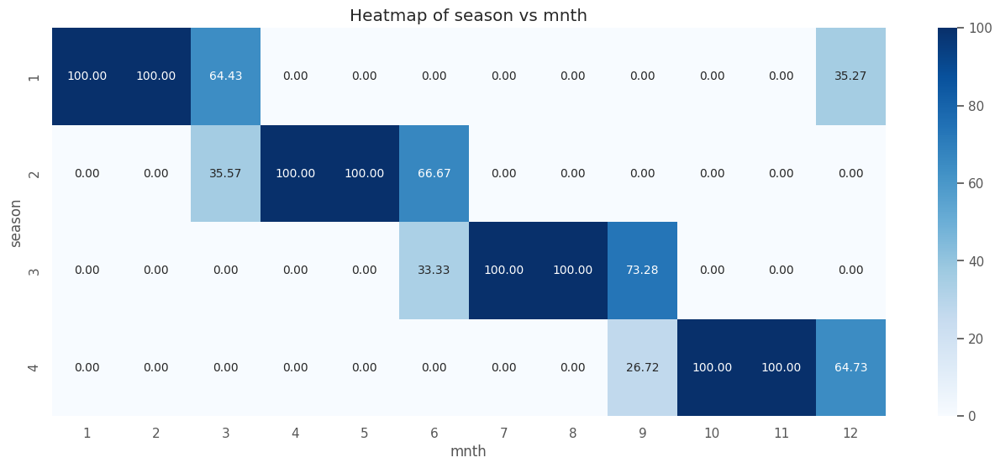

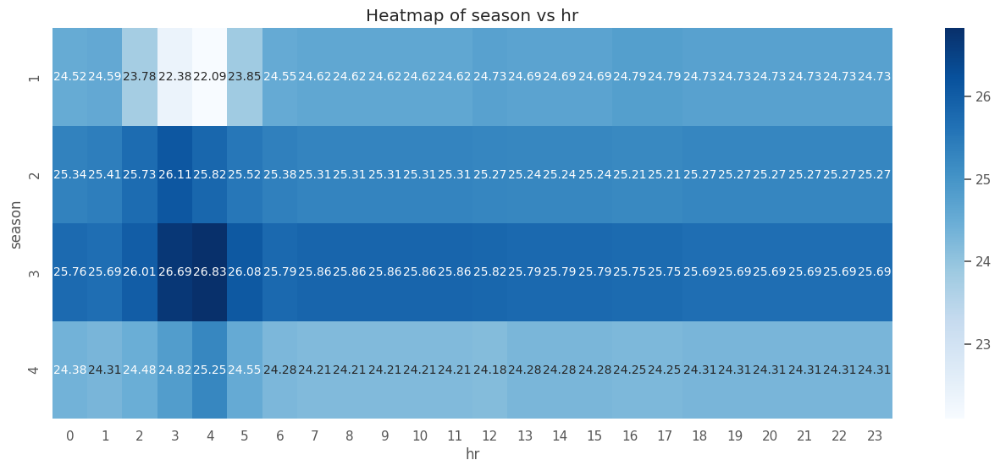

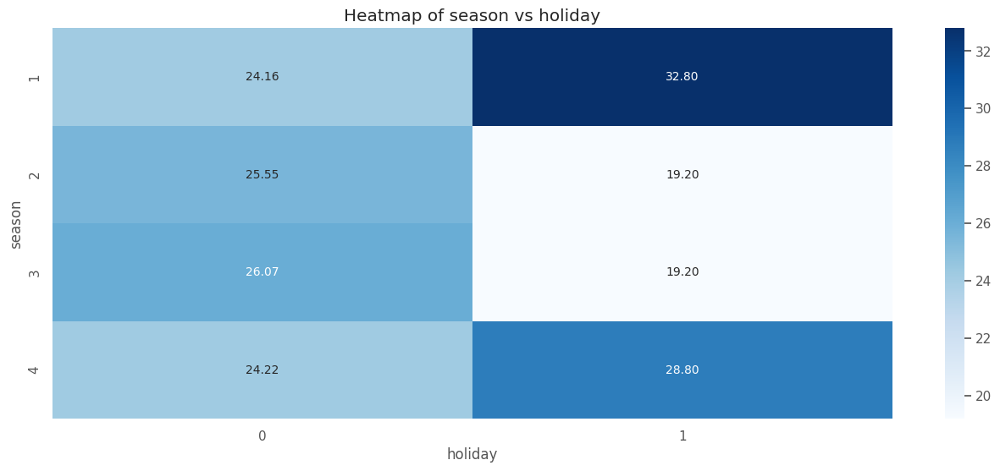

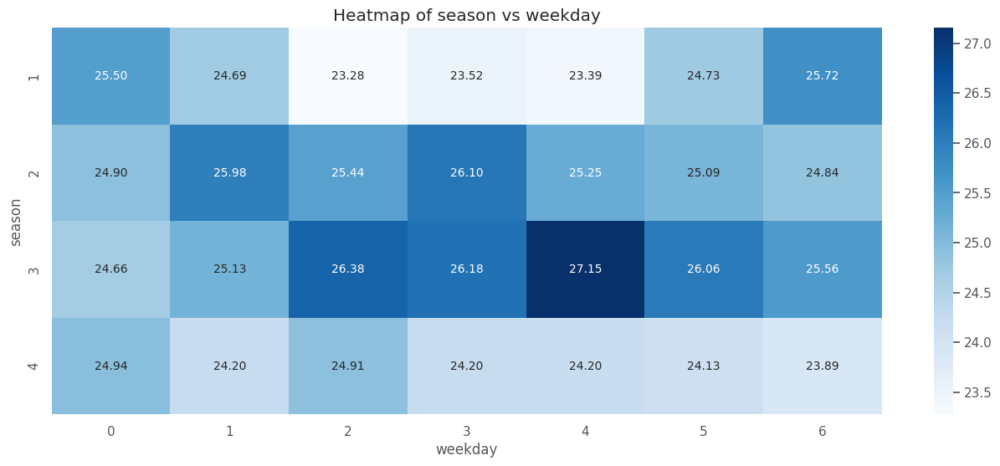

...

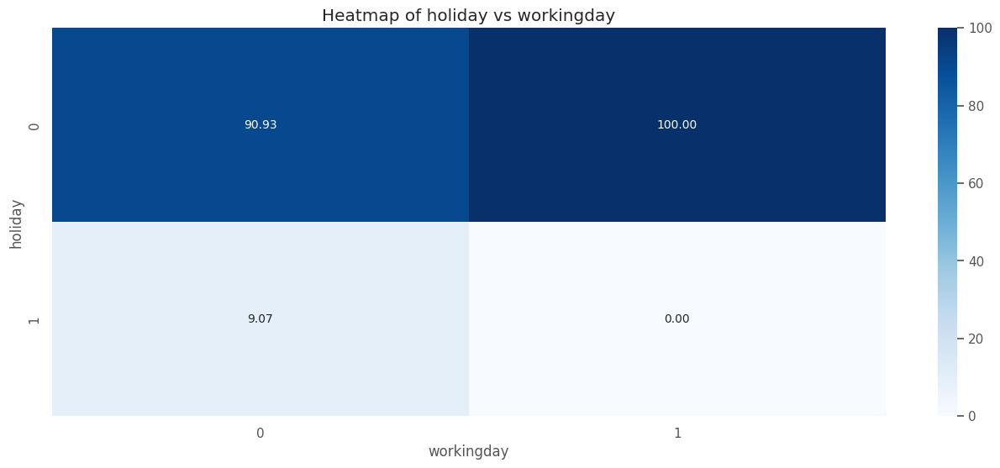

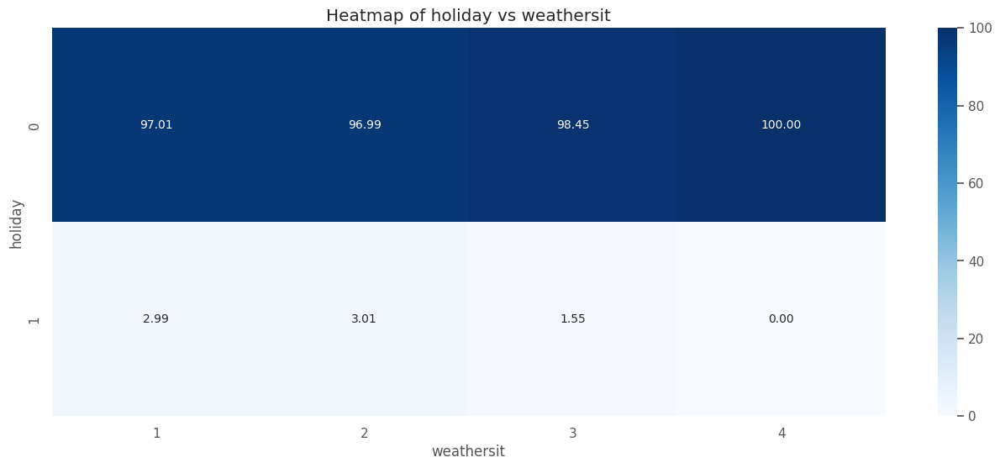

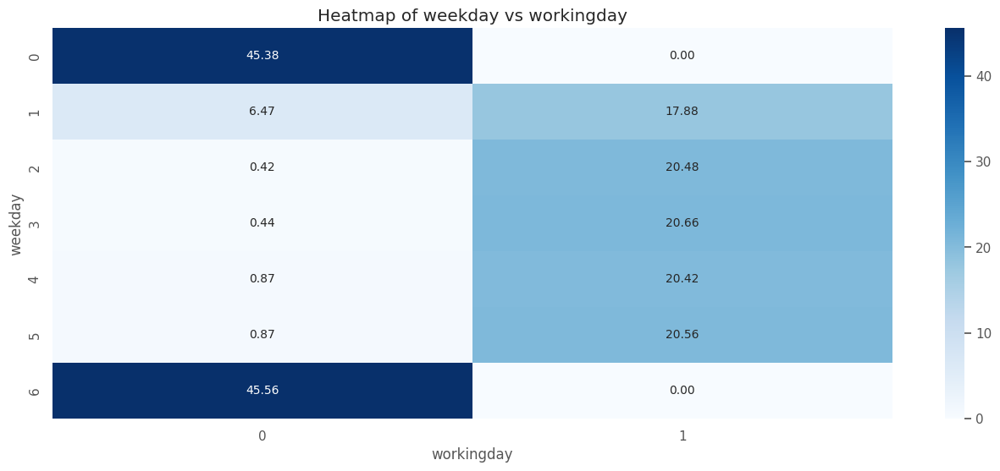

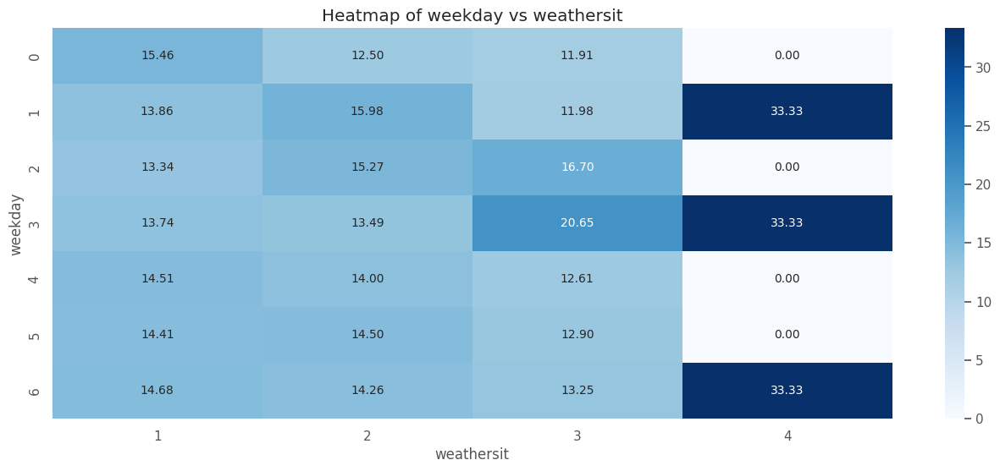

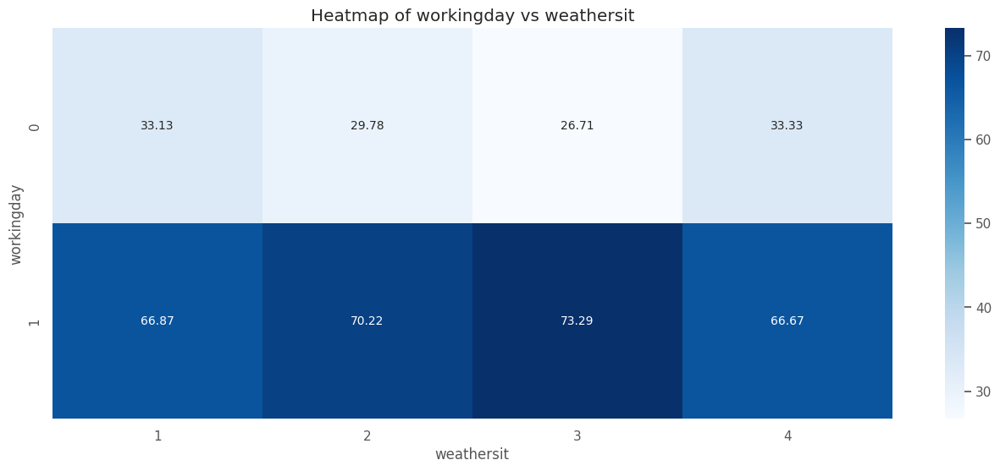

In [ ]:
categorical_vars = ['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit']

for i in range(len(categorical_vars)):
    for j in range(i + 1, len(categorical_vars)):  # Avoid redundant pairs
        bivariate_categorical_analysis(df, categorical_vars[i], categorical_vars[j])


### **3.2.2 Investigation Of Correlation Matrix**

In [ ]:
df.shape

(17379, 16)

In [ ]:
# dropping dteday
df.drop('dteday', axis=1, inplace=True)

In [ ]:
df.shape

(17379, 15)

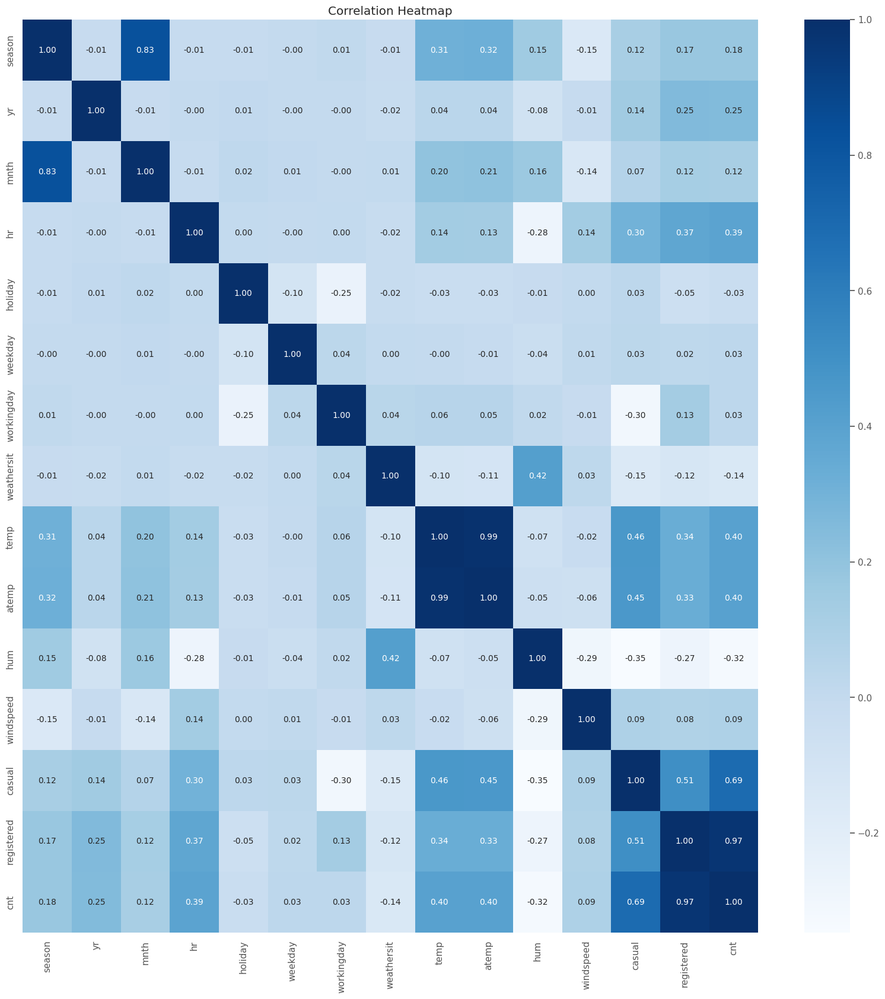

In [ ]:
corr = df.corr()
plt.figure(figsize=(20, 20))
plt.title('Correlation Heatmap')
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f')
plt.show()

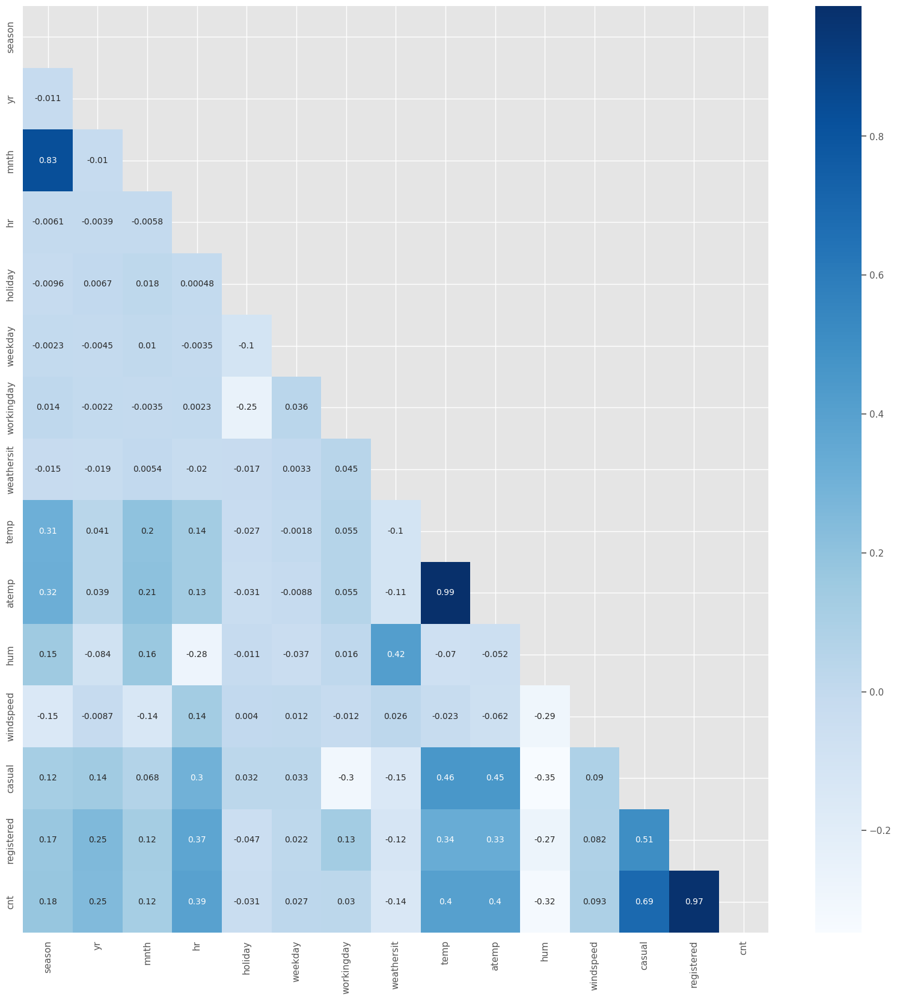

In [ ]:
# Generate a correlation matrix
corr = df.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(20, 20))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

**Highly Correlated Features:**
1. temp and atemp (0.99)
2. cnt and registered (0.97)
3. cnt and casual (0.69)
---


**Moderately Correlated Features:**
1. temp and cnt (0.4)
2. yr and cnt (0.25)
3. yr and registered (0.51)
4. season and cnt (0.18)

---

**Weakly Correlated Features:**
1. holiday
2. weekday and cnt (-0.14)
3. weathersit and cnt (-0.14)
4. workingday with other features

---



### **3.2.4 Preprocessing**

**Creating a copy of dataset df as df_copy**

---



In [ ]:
df_copy = df.copy()

#### **3.2.4.1 Handling Missing Data And Duplicated Data**

**From EDA, it is evident that there is no missing value in the data.**

---



In [ ]:
df.isnull().sum()

,0
season,0
yr,0
mnth,0
hr,0
holiday,0
weekday,0
workingday,0
weathersit,0
temp,0
atemp,0


In [ ]:
df.duplicated().sum()

2

In [ ]:
# checking for duplicated rows
df[df.duplicated()]

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
8126,4,0,12,6,0,6,0,1,0.24,0.2576,0.65,0.1045,1,10,11
13727,3,1,7,4,0,2,1,1,0.66,0.6061,0.83,0.0896,0,6,6


In [ ]:
# shape before dropping
print("Dataset before dropping duplicates: ")
print(df.shape)

Dataset before dropping duplicates: 
(17379, 15)


In [ ]:
# dropping duplicates
df.drop_duplicates(inplace=True)

In [ ]:
# shape after dropping duplicates
print("Dataset after dropping duplicates: ")
print(df.shape)

Dataset after dropping duplicates: 
(17377, 15)


#### **3.2.4.2 Feature Scaling**

Feature Scaling is an important step because it is evident in the univariate analysis that most of the features contains alot of outliers but those outliers are present in clusters form. They will definetely play a significant role in predicting outcome. Feature Scaling will help us to cope up with this problem to some extent.

**out of 7 numerical variables 4 are normally distributed and 3 are near to the normal but are positively skewed**

In [ ]:

from sklearn.preprocessing import RobustScaler

numerical_features = [
    'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt'
]

scaler = RobustScaler()
df[numerical_features] = scaler.fit_transform(df[numerical_features])

#### **3.2.4.3 Encoding Categorical Variables**

**As the categorical features already present as integer datatype so there is no need of encoding the categorical variables**

---



#### **3.2.4.4 Outlier Detection**




In [ ]:
from scipy import stats

# Calculate Z-scores for all numerical columns
z_scores = np.abs(stats.zscore(df.select_dtypes(include=np.number)))

# Define a threshold for identifying outliers (e.g., Z-score > 3)
threshold = 3

# Identify rows with outliers in any column
outlier_rows = np.where(z_scores > threshold)

# Get the indices of the rows containing outliers
outlier_indices = list(set(outlier_rows[0]))

# printing the number of rows containing outliers
print("Number of rows containing outliers:", len(outlier_indices))

Number of rows containing outliers: 1445


In [ ]:
# calculating the percentage of outliers with complete dataset
percentage_outliers = (len(outlier_indices) / len(df)) * 100
percentage_outliers

8.315589572423319

In [ ]:
# Access the rows with outliers using the outlier_indices
outlier_rows_df = df.iloc[outlier_indices]
outlier_rows_df

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
16422,4,1,11,0,1,4,0,1,-0.5625,-0.526224,0.100000,-0.699732,-0.318182,-0.387097,-0.398340
16423,4,1,11,1,1,4,0,1,-0.6875,-0.631469,0.066667,-0.699732,-0.272727,-0.419355,-0.414938
16424,4,1,11,2,1,4,0,1,-0.8125,-0.789163,0.400000,-0.699732,-0.318182,-0.537634,-0.514523
16425,4,1,11,3,1,4,0,1,-0.8125,-0.789163,0.400000,-0.599866,-0.386364,-0.586022,-0.564315
16426,4,1,11,4,1,4,0,1,-0.8750,-0.894408,0.566667,-0.400134,-0.363636,-0.607527,-0.576763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8068,4,0,12,20,0,3,1,3,-0.5000,-0.683918,0.800000,3.001340,-0.363636,-0.483871,-0.481328
16262,4,1,11,8,0,4,1,2,-0.6250,-0.683918,-0.066667,0.200402,0.090909,2.741935,2.091286
16286,4,1,11,8,0,5,1,2,-0.5625,-0.526224,-0.200000,-0.400134,0.000000,3.112903,2.360996
16358,4,1,11,8,0,1,1,2,-0.4375,-0.526224,0.100000,0.700402,-0.090909,2.876344,2.161826


In [ ]:
# shape of data with the outliers
print("Dataset with outliers: ")
print(df.shape)

Dataset with outliers: 
(17377, 15)


In [ ]:
# dropping the outliers
df_without_outliers = df.drop(index=df.index[outlier_indices])

In [ ]:
# shape of data without the outliers
print("Dataset without outliers: ")
print(df_without_outliers.shape)

Dataset without outliers: 
(15932, 15)


#### **3.2.4.5 Feature Engineering**

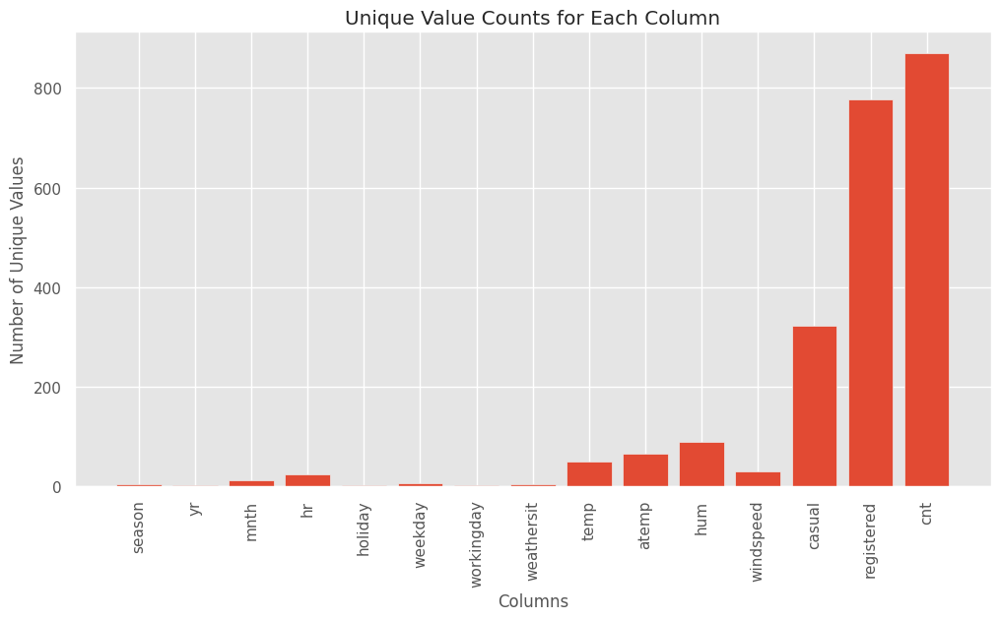

In [ ]:
# Calculate the number of unique values for each column
unique_counts = df.nunique()

# Create a bar plot to visualize the number of unique values for each column
plt.figure(figsize=(12, 6))
plt.bar(unique_counts.index, unique_counts.values)
plt.xticks(rotation=90)
plt.xlabel("Columns")
plt.ylabel("Number of Unique Values")
plt.title("Unique Value Counts for Each Column")
plt.show()

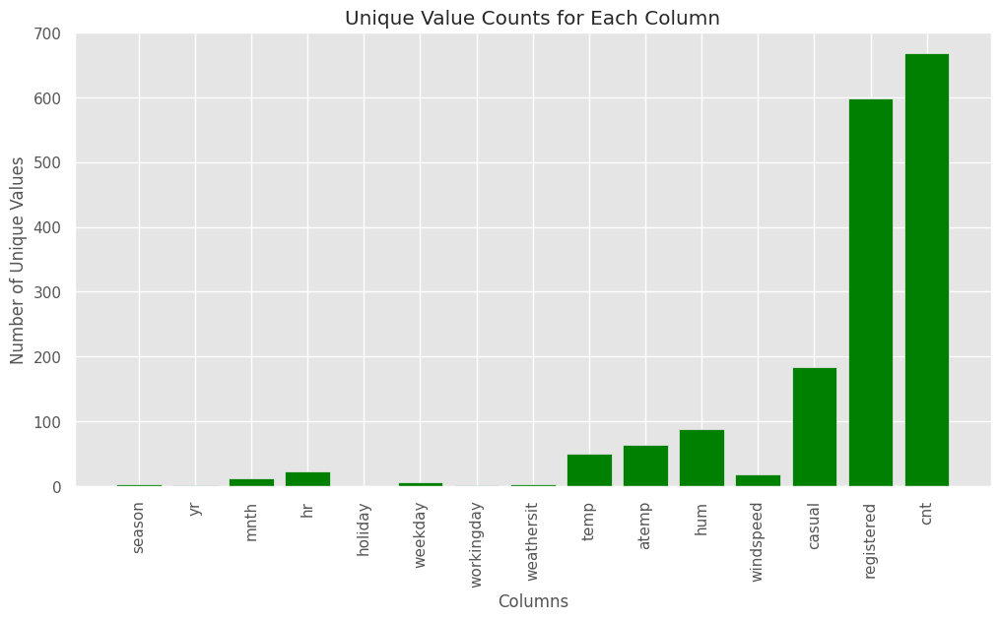

In [ ]:
# Calculate the number of unique values for each column
unique_counts = df_without_outliers.nunique()

# Create a bar plot to visualize the number of unique values for each column
plt.figure(figsize=(12, 6))
plt.bar(unique_counts.index, unique_counts.values, color='green')
plt.xticks(rotation=90)
plt.xlabel("Columns")
plt.ylabel("Number of Unique Values")
plt.title("Unique Value Counts for Each Column")
plt.show()

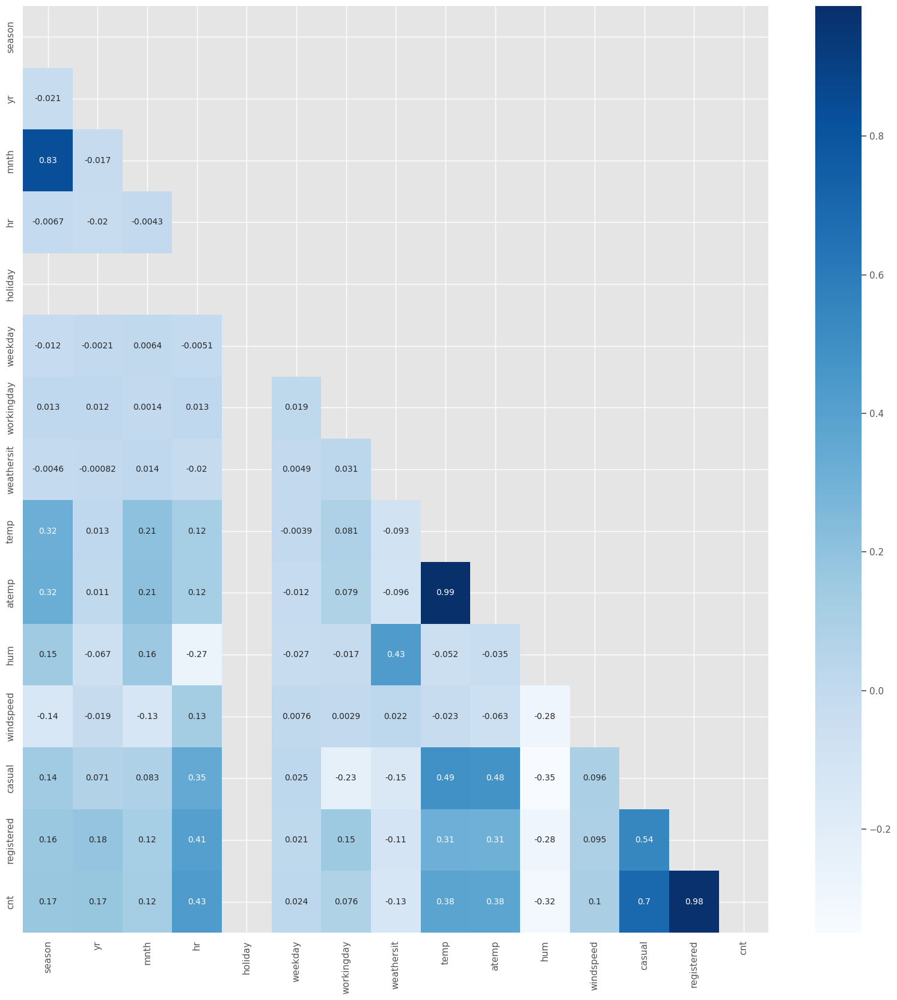

In [ ]:
# Generate a correlation matrix
corr = df_without_outliers.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(20, 20))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

**Highly Correlated Features:**
1. temp and atemp (0.99)
2. cnt and registered (0.97)
3. cnt and casual (0.69)
---


**Moderately Correlated Features:**
1. temp and cnt (0.4)
2. yr and cnt (0.25)
3. yr and registered (0.51)
4. season and cnt (0.18)

---

**Weakly Correlated Features:**
1. holiday
2. weekday and cnt (-0.14)
3. weathersit and cnt (-0.14)
4. workingday with other features

---



#### **3.2.4.6 Adressing Multicollinearity And Features Selection**

##### **Dropping atemp**

In [ ]:
df.drop(['atemp'], axis=1, inplace=True)

In [ ]:
df.shape

(17377, 14)

In [ ]:
# dropping features that are highly correlated
df_without_outliers.drop(['atemp'],axis=1,inplace=True)

In [ ]:
df_without_outliers.shape

(15932, 14)

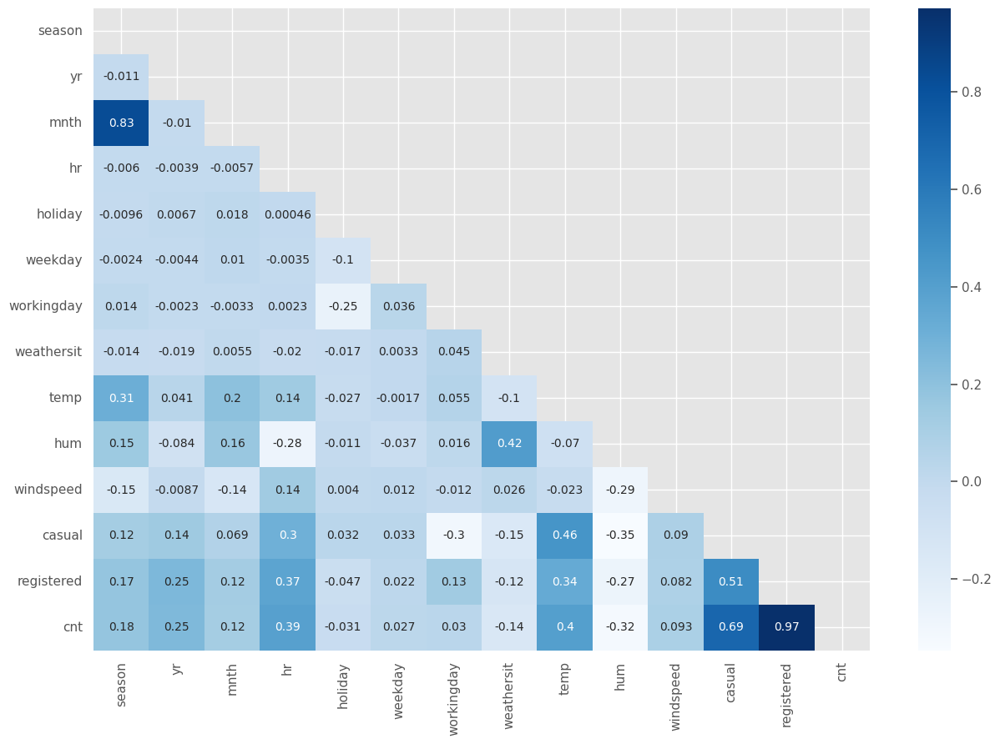

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

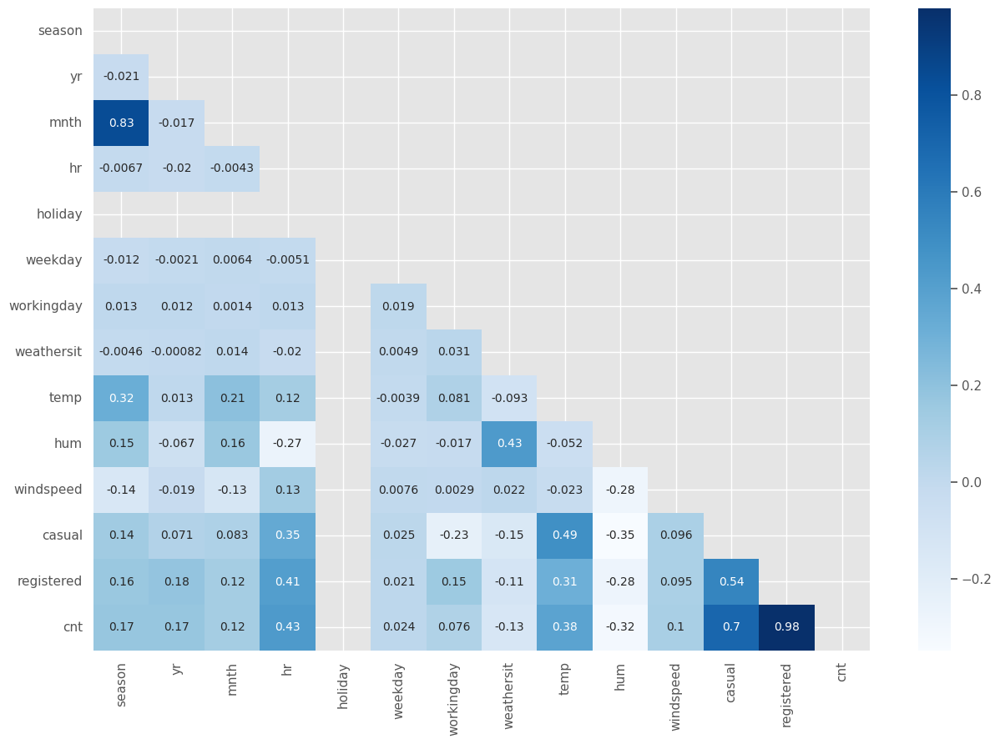

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df_without_outliers.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

##### **dropping season**

In [ ]:
df.drop(['season'], axis=1, inplace=True)

In [ ]:
df.shape

(17377, 13)

In [ ]:
# dropping features that are highly correlated
df_without_outliers.drop(['season'],axis=1,inplace=True)

In [ ]:
df_without_outliers.shape

(15932, 13)

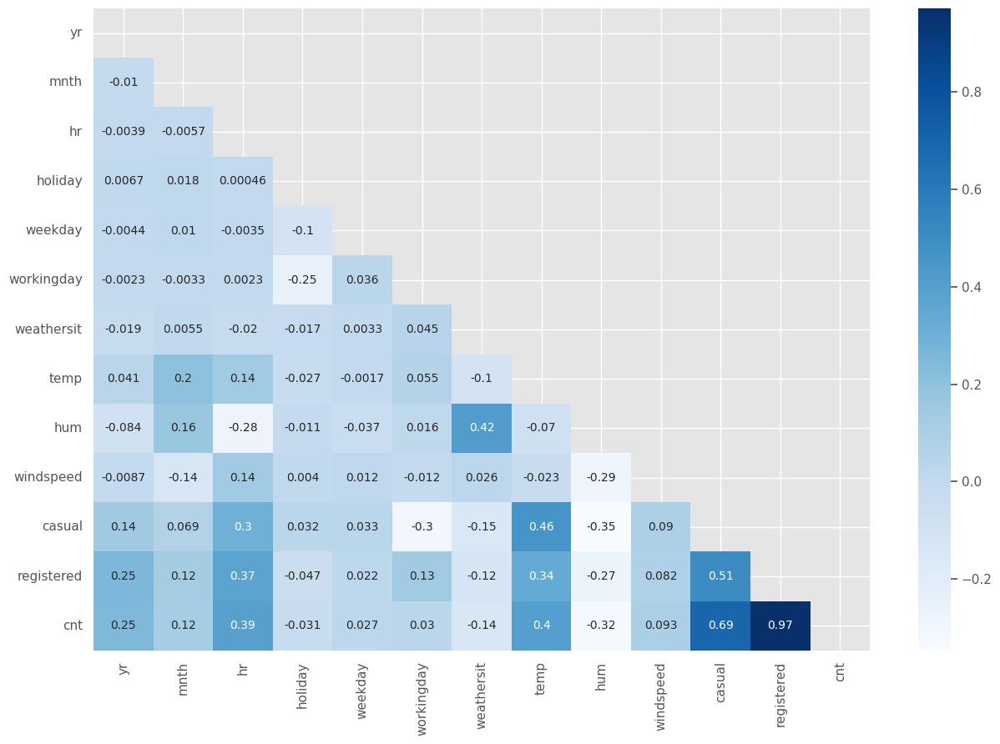

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

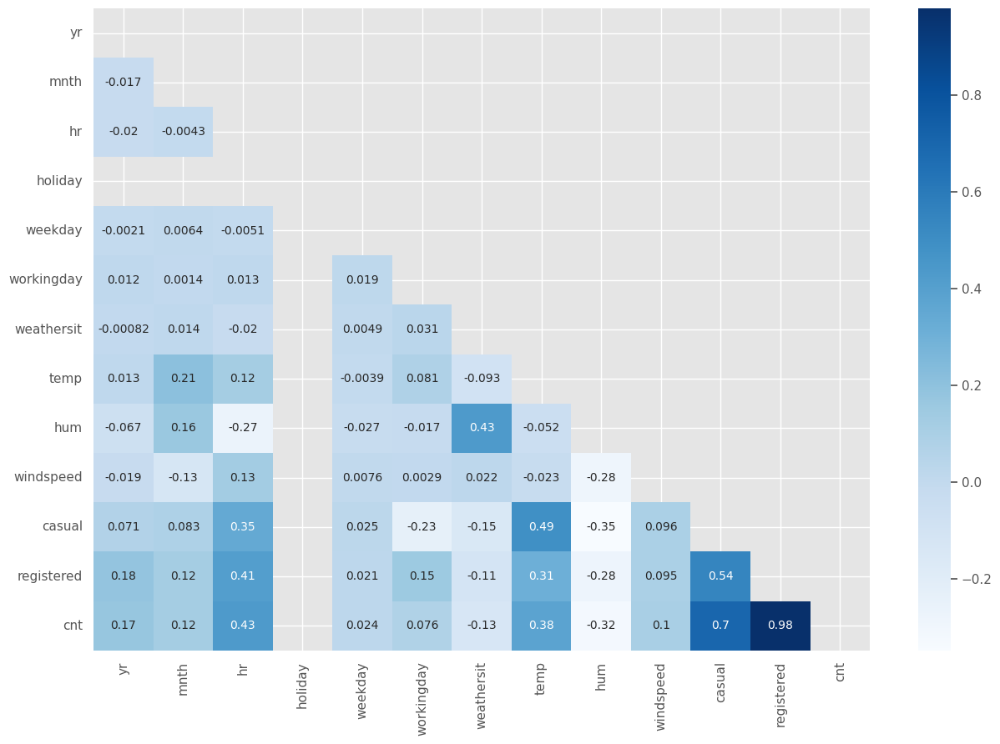

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df_without_outliers.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

In [ ]:
df['holiday'].value_counts()


,count
holiday,
0,16877
1,500


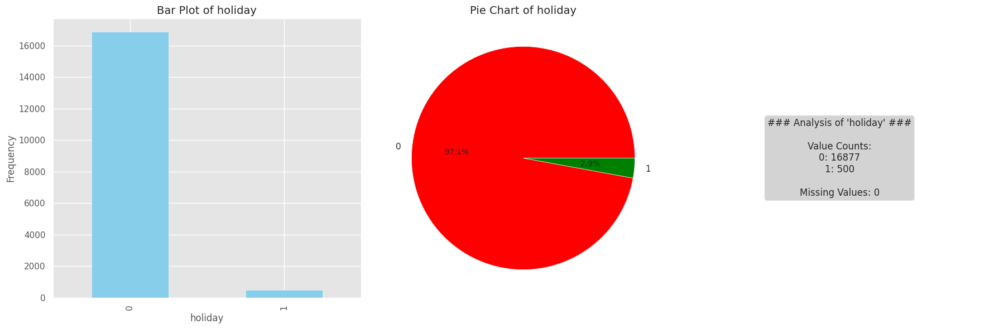

In [ ]:
analyze_categorical_variable(df, 'holiday')

In [ ]:
df_without_outliers['holiday'].value_counts()

,count
holiday,
0,15932


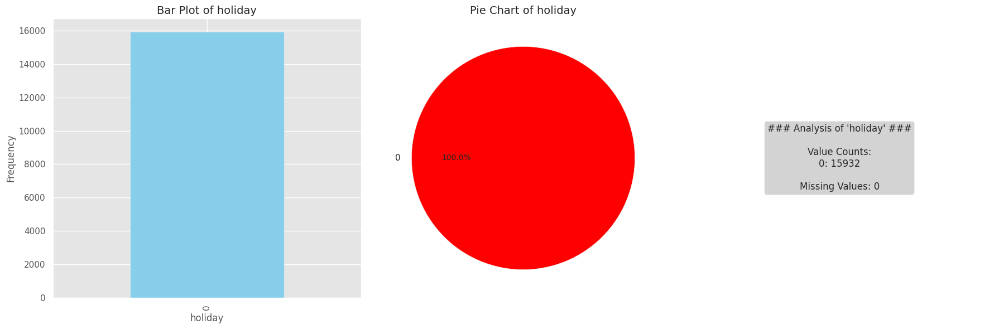

In [ ]:
analyze_categorical_variable(df_without_outliers, 'holiday')

##### **outliers and collinearilty analysis till here**
out of 1445 outliers, 500 are the 1 value of holiday and 945 are the 0 value of column holiday. Sum of these is 1445. If I drop outliers, the whole impact of the holiday on target variable is zero as evident from the correlation matrix. So, I have decided to keep the outliers in the dataset because these are not actual outliers.

In [ ]:
df_copy['casual']

,casual
0,3
1,8
2,5
3,3
4,0
...,...
17374,11
17375,8
17376,7
17377,13


In [ ]:
df_copy['registered']

,registered
0,13
1,32
2,27
3,10
4,1
...,...
17374,108
17375,81
17376,83
17377,48


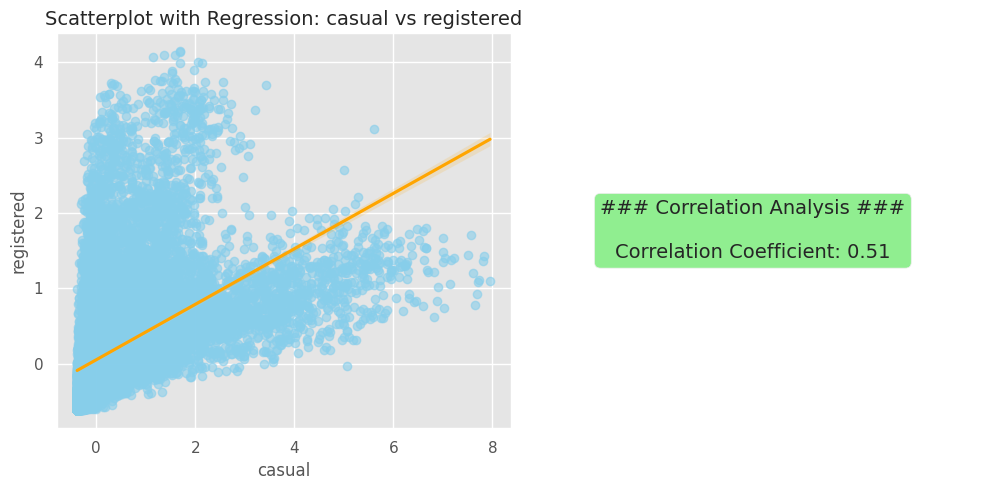

In [ ]:
bivariate_analysis_numerical_numerical(df, 'casual', 'registered')

In [ ]:
# import vif
from statsmodels.stats.outliers_influence import variance_inflation_factor

# calculating vif
vif_data = pd.DataFrame()
vif_data["feature"] = df.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(df.values, i)
                   for i in range(df.shape[1])]

print(vif_data)

       feature          VIF
0           yr     1.093148
1         mnth     1.107665
2           hr     1.259238
3      holiday     1.082304
4      weekday     1.015278
5   workingday     1.404255
6   weathersit     1.280980
7         temp     1.423069
8          hum     1.655972
9    windspeed     1.137548
10      casual   566.698503
11  registered  5146.128357
12         cnt  7329.005191


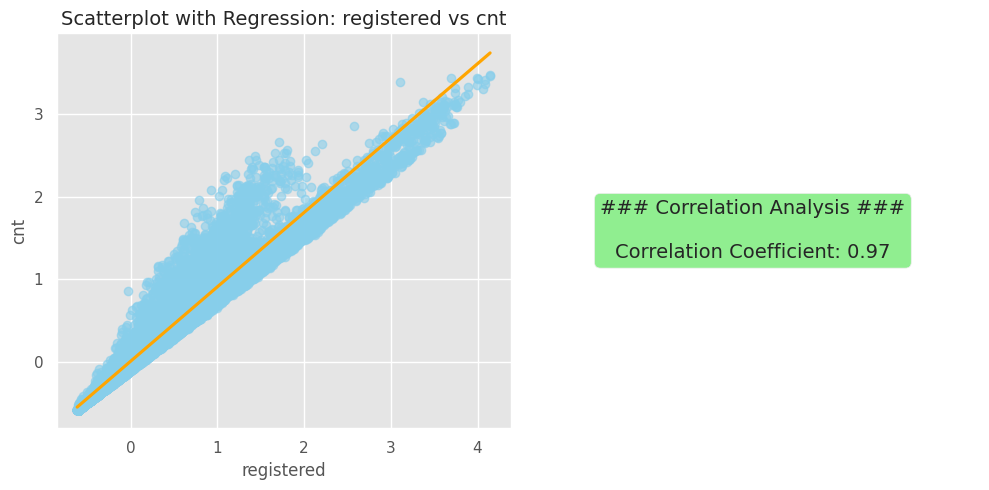

In [ ]:
bivariate_analysis_numerical_numerical(df, 'registered', 'cnt')

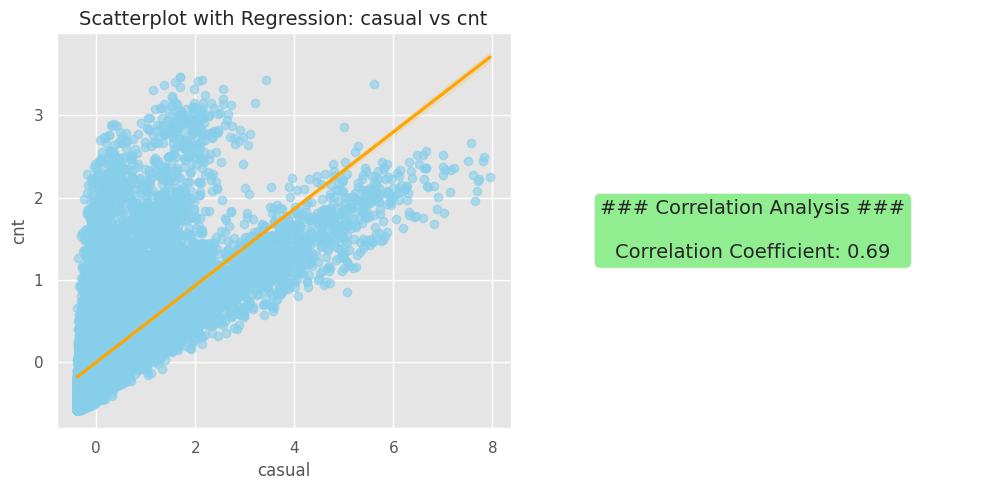

In [ ]:
bivariate_analysis_numerical_numerical(df, 'casual', 'cnt')

##### **Dropping registered**

In [ ]:
df.drop(['registered'], axis=1, inplace=True)

In [ ]:
df.shape

(17377, 12)

In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      17379 non-null  int64  
 1   yr          17379 non-null  int64  
 2   mnth        17379 non-null  int64  
 3   hr          17379 non-null  int64  
 4   holiday     17379 non-null  int64  
 5   weekday     17379 non-null  int64  
 6   workingday  17379 non-null  int64  
 7   weathersit  17379 non-null  int64  
 8   temp        17379 non-null  float64
 9   atemp       17379 non-null  float64
 10  hum         17379 non-null  float64
 11  windspeed   17379 non-null  float64
 12  casual      17379 non-null  int64  
 13  registered  17379 non-null  int64  
 14  cnt         17379 non-null  int64  
dtypes: float64(4), int64(11)
memory usage: 2.0 MB


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17377 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17377 non-null  int64  
 1   mnth        17377 non-null  int64  
 2   hr          17377 non-null  int64  
 3   holiday     17377 non-null  int64  
 4   weekday     17377 non-null  int64  
 5   workingday  17377 non-null  int64  
 6   weathersit  17377 non-null  int64  
 7   temp        17377 non-null  float64
 8   hum         17377 non-null  float64
 9   windspeed   17377 non-null  float64
 10  casual      17377 non-null  float64
 11  cnt         17377 non-null  float64
dtypes: float64(5), int64(7)
memory usage: 2.2 MB


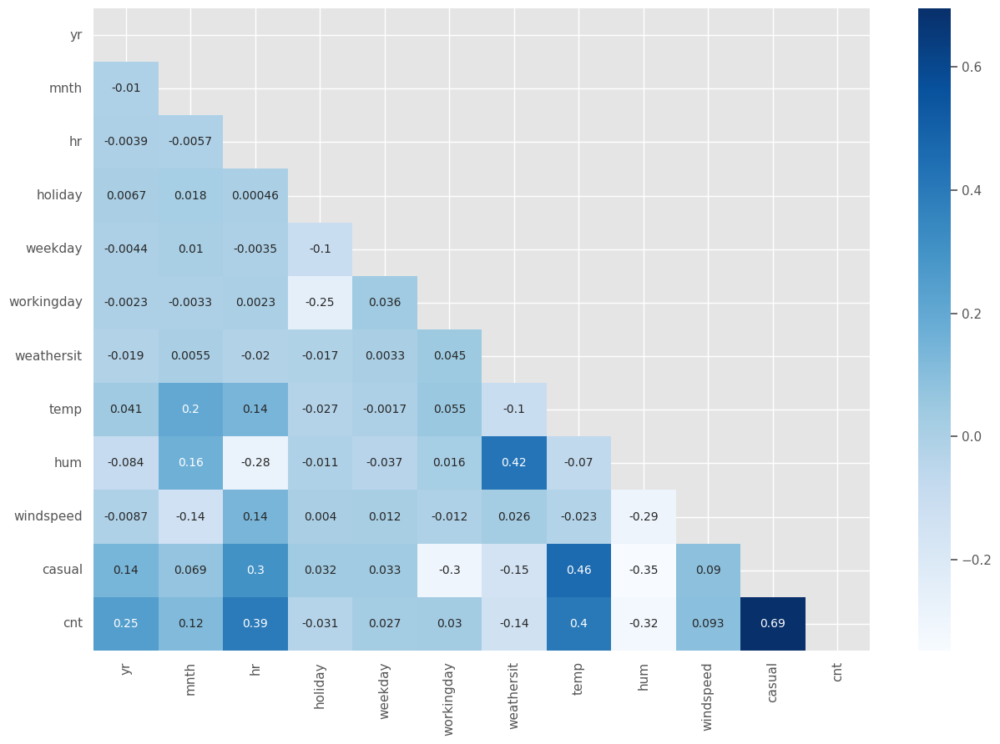

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

##### **Dropping casual**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17377 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17377 non-null  int64  
 1   mnth        17377 non-null  int64  
 2   hr          17377 non-null  int64  
 3   holiday     17377 non-null  int64  
 4   weekday     17377 non-null  int64  
 5   workingday  17377 non-null  int64  
 6   weathersit  17377 non-null  int64  
 7   temp        17377 non-null  float64
 8   hum         17377 non-null  float64
 9   windspeed   17377 non-null  float64
 10  casual      17377 non-null  float64
 11  cnt         17377 non-null  float64
dtypes: float64(5), int64(7)
memory usage: 2.2 MB


In [ ]:
df.drop(['casual'], axis=1, inplace=True)

In [ ]:
df.shape

(17377, 11)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17377 entries, 0 to 17378
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17377 non-null  int64  
 1   mnth        17377 non-null  int64  
 2   hr          17377 non-null  int64  
 3   holiday     17377 non-null  int64  
 4   weekday     17377 non-null  int64  
 5   workingday  17377 non-null  int64  
 6   weathersit  17377 non-null  int64  
 7   temp        17377 non-null  float64
 8   hum         17377 non-null  float64
 9   windspeed   17377 non-null  float64
 10  cnt         17377 non-null  float64
dtypes: float64(4), int64(7)
memory usage: 2.1 MB


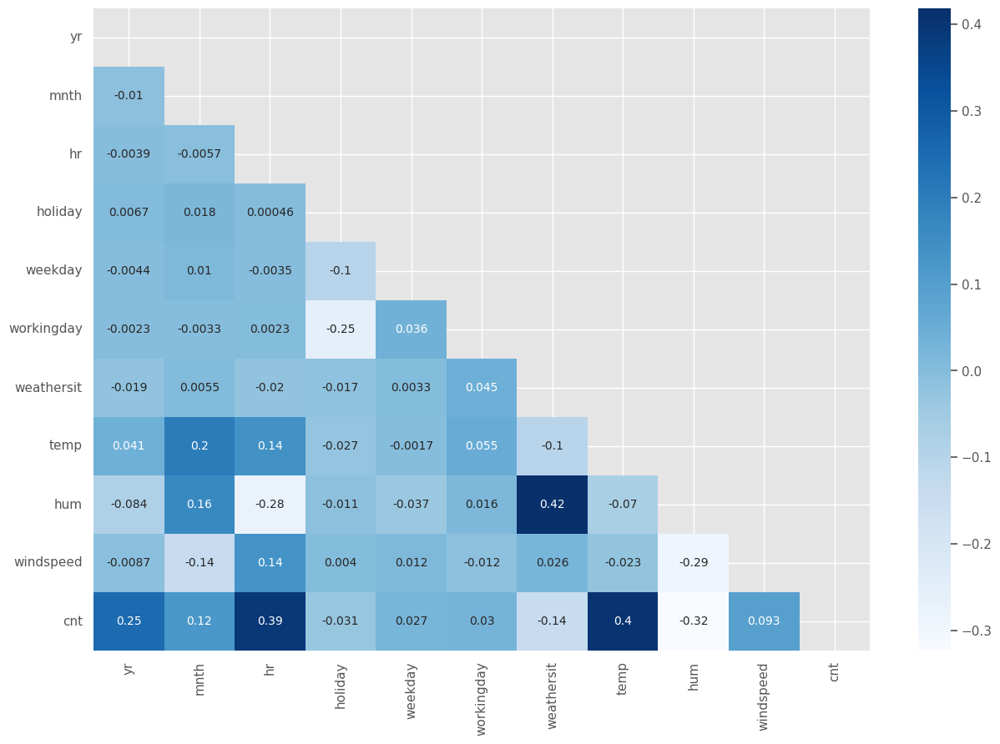

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

### **3.2.5 Train Test Split**

In [ ]:
X = df.drop('cnt', axis=1)
y = df['cnt']

In [ ]:
X.shape

(17377, 10)

In [ ]:
y.shape

(17377,)

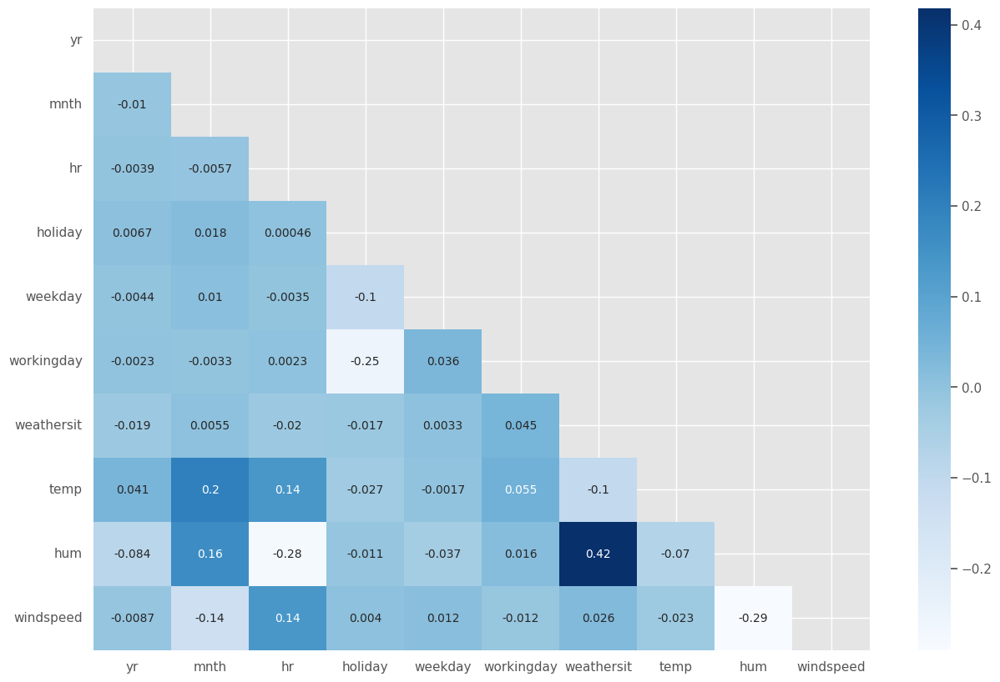

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = X.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# store splits in csv
X_train.to_csv('X_train.csv', index=False)
X_test.to_csv('X_test.csv', index=False)
y_train.to_csv('y_train.csv', index=False)
y_test.to_csv('y_test.csv', index=False)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(13901, 10)
(3476, 10)
(13901,)
(3476,)


###### **Storing the modified dataset**

In [ ]:
# storing the modified dataset
df_without_outliers.to_csv('updated_data_regression.csv', index=False)

## **3.3 SVM Implementation**

#### **3.3.1 Linear SVM Classifier**

**Regularization Parameter (C)**

This parameter controls the trade-off between achieving a low training error and minimizing the norm of the weights. A higher value of C allows for more flexibility in the decision boundary, potentially leading to overfitting, while a lower value of C imposes a smoother decision boundary and may lead to underfitting.

5 fold cross validation

In [ ]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from scipy.stats import uniform

# Define the parameter distribution
param_dist_linear_svr = {'C': uniform(0.1, 10)}  # Reduced range for C

# Initialize the linear SVR model
linear_svr = SVR(kernel='linear')

# Define the number of chunks
n_chunks = 10

# Split the data into chunks
X_chunks = np.array_split(X_train, n_chunks)
y_chunks = np.array_split(y_train, n_chunks)

# Initialize variables to store results
best_params_list = []
best_scores_list = []

# Loop through each chunk
for i in range(n_chunks):
    print(f"Training on chunk {i + 1} of {n_chunks}...")

    # Perform random search
    random_search_linear_svr = RandomizedSearchCV(
        estimator=linear_svr,
        param_distributions=param_dist_linear_svr,
        n_iter=5,       # Reduced iterations
        cv=5,           # Cross-validation folds
        random_state=42,
        scoring='neg_mean_squared_error',
        n_jobs=-1       # Use all cores
    )

    # Fit the model on the current chunk
    random_search_linear_svr.fit(X_chunks[i], y_chunks[i])

    # Store the best parameters and score for the current chunk
    best_params_list.append(random_search_linear_svr.best_params_)
    best_scores_list.append(random_search_linear_svr.best_score_)

# Calculate average results
average_score = np.mean(best_scores_list)

# Output the average score and list of best parameters
print(f"Average Best Score: {average_score}")
print("Best Parameters from each chunk:")
for idx, params in enumerate(best_params_list):
    print(f"Chunk {idx + 1}: {params}")


Training on chunk 1 of 10...
Training on chunk 2 of 10...
Training on chunk 3 of 10...
Training on chunk 4 of 10...
Training on chunk 5 of 10...
Training on chunk 6 of 10...
Training on chunk 7 of 10...
Training on chunk 8 of 10...
Training on chunk 9 of 10...
Training on chunk 10 of 10...
Average Best Score: -0.38467372620427676
Best Parameters from each chunk:
Chunk 1: {'C': 9.60714306409916}
Chunk 2: {'C': 9.60714306409916}
Chunk 3: {'C': 9.60714306409916}
Chunk 4: {'C': 9.60714306409916}
Chunk 5: {'C': 9.60714306409916}
Chunk 6: {'C': 9.60714306409916}
Chunk 7: {'C': 9.60714306409916}
Chunk 8: {'C': 6.086584841970366}
Chunk 9: {'C': 1.6601864044243653}
Chunk 10: {'C': 1.6601864044243653}


#### **3.3.2 Non-Linear SVM Classifier**

5 fold cross validation

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from scipy.stats import uniform

# Define the parameter distribution for RBF kernel
param_dist_rbf_svr = {
    'C': uniform(0.1, 10),      # Range for C
    'gamma': uniform(0.001, 0.1)  # Range for gamma
}

# Initialize the RBF SVR model
rbf_svr = SVR(kernel='rbf')

# Perform random search
random_search_rbf_svr = RandomizedSearchCV(
    estimator=rbf_svr,
    param_distributions=param_dist_rbf_svr,
    n_iter=5,       # Reduced iterations
    cv=5,           # Cross-validation folds
    random_state=42,
    scoring='neg_mean_squared_error',
    n_jobs=-1       # Use all cores
)

# Fit the model on the entire dataset
random_search_rbf_svr.fit(X_train, y_train)

# Output the best parameters and score
print(f"Best Parameters: {random_search_rbf_svr.best_params_}")
print(f"Best Score: {random_search_rbf_svr.best_score_}")


## **3.4 Model Evaluation**

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Evaluate Linear SVM Regression
y_pred_linear_svr = random_search_linear_svr.predict(X_test)
print("Linear SVM Regression Results:")
print("MAE:", mean_absolute_error(y_test, y_pred_linear_svr))
print("MSE:", mean_squared_error(y_test, y_pred_linear_svr))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_linear_svr)))
print("R2 Score:", r2_score(y_test, y_pred_linear_svr))

In [ ]:
# Evaluate Non-linear SVM Regression
y_pred_rbf_svr = random_search_rbf_svr.predict(X_test)
print("\nNon-linear SVM Regression Results:")
print("MAE:", mean_absolute_error(y_test, y_pred_rbf_svr))
print("MSE:", mean_squared_error(y_test, y_pred_rbf_svr))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_rbf_svr)))
print("R2 Score:", r2_score(y_test, y_pred_rbf_svr))

##### **Visualization**

In [ ]:
# Scatter plot of actual vs predicted values for Linear SVM Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_linear_svr, alpha=0.7, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', linewidth=2)
plt.title("Linear SVM Regression: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()


In [ ]:
# Scatter plot of actual vs predicted values for Non-linear SVM Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_rbf_svr, alpha=0.7, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', linewidth=2)
plt.title("Non-linear SVM Regression: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()

**Residual plot for Linear SVM Regression**

In [ ]:

# Residual plot for Linear SVM Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_linear_svr, y_test - y_pred_linear_svr, alpha=0.7, color='blue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title("Residual Plot: Linear SVM Regression")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.show()

**Residual plot for Non-Linear SVM Regression**

In [ ]:
# Residual plot for Non-linear SVM Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_rbf_svr, y_test - y_pred_rbf_svr, alpha=0.7, color='green')
plt.axhline(y=0, color='r', linestyle='--')
plt.title("Residual Plot: Non-linear SVM Regression")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.show()

# **Regression: Linear vs Non-Linear SVM**

### **Evaluation of Linear SVM**

**Evaluation Metrics**

The performance of the Linear Support Vector Machine (SVM) regression was evaluated using multiple statistical metrics:

Mean Absolute Error (MAE): 0.4098

Mean Squared Error (MSE): 0.3450

Root Mean Squared Error (RMSE): 0.5874

R² Score: 0.3473

The metrics suggest that the Linear SVM regression model provides a fair level of predictive accuracy but leaves room for improvement, especially in capturing complex relationships within the data.

### **Evaluation of Non-Linear SVM**

The Non-linear SVM regression model, using the RBF kernel, was evaluated on multiple performance metrics:  
- **Mean Absolute Error (MAE):** 0.1221 — This low value demonstrates that, on average, the predicted values deviate minimally from the actual values.  
- **Mean Squared Error (MSE):** 0.0345 — The MSE value indicates that the model effectively minimizes large deviations.  
- **Root Mean Squared Error (RMSE):** 0.1858 — This further confirms the small average magnitude of error, emphasizing the model’s precision.  
- **R² Score:** 0.9347 — The model explains 93.47% of the variance in the target variable, showcasing its robustness and suitability for this regression problem.  

The results reflect a significant improvement over the Linear SVM, underlining the power of the RBF kernel in capturing non-linear relationships.

---



# **5. Presentation, Discussion adn Results**

## **Regression Task**

### **Linear SVM**

#### **Presentation**
The performance of the Linear Support Vector Machine (SVM) regression model was evaluated to predict target values using various metrics and visual tools. The evaluation metrics, including Mean Absolute Error (MAE) of 0.4098, Mean Squared Error (MSE) of 0.3450, Root Mean Squared Error (RMSE) of 0.5874, and R² Score of 0.3473, indicate a moderate level of predictive accuracy. While the model effectively captures trends in the data, it struggles with certain complex relationships, particularly at higher ranges of target values.


To assess model behavior visually, an Actual vs. Predicted Plot and a Residual Plot were generated. The Actual vs. Predicted Plot showed that the model aligns well with the target values for moderate ranges, as evident by the clustering of points near the diagonal. However, deviations at higher values revealed areas where the model underperformed, likely due to the limitations of the linear kernel. Similarly, the Residual Plot highlighted a widening spread of residuals for higher predictions, further emphasizing the inability of the model to handle non-linear relationships effectively.


The hyperparameter optimization process revealed consistency across data chunks, with most chunks favoring a high C value of 9.6071, indicating the need for reduced regularization to capture patterns better. However, some chunks selected lower C values, suggesting variations in local data patterns. These observations underline the model's linear nature, which limits its flexibility in addressing the complexities of the dataset.


---



#### **Discussion**

**Strengths:**

Consistency of results across chunks during hyperparameter optimization.
Ability to generalize moderately well to unseen data.


---


**Weaknesses:**

Linear SVM shows limitations in capturing non-linear patterns in the data.
Residual patterns suggest systematic errors, especially at higher target ranges.


---


**Insights from Hyperparameters:**

Most chunks converged to a high C value (9.6071), indicating the need for reduced regularization. However, some chunks preferred lower C values, suggesting local variations in data distribution.


---



#### **Results**
**Final Metrics:**

MAE: 0.4098

MSE: 0.3450

RMSE: 0.5874

R² Score: 0.3473



---


**Visual Analysis:**

Actual vs. Predicted Plot confirms alignment with target values but highlights challenges at higher ranges.
Residual Plot reveals systematic patterns, indicating the need for non-linear methods.


---



### **Non-Linear SVM**

#### **Presentation of Results**

The Non-linear SVM regression model with the RBF kernel demonstrated remarkable performance across all metrics. Its ability to handle non-linear relationships was evident from the high **R² score** of 0.9347, indicating that it captured most of the variation in the target variable. The **MAE** and **RMSE** values, 0.1221 and 0.1858 respectively, highlight the model's precision, showing minimal errors between actual and predicted values. Additionally, the **MSE** of 0.0345 confirms that the model effectively penalizes larger errors.  

The best hyperparameters for this model were **C = 3.8454** and **gamma = 0.0961**, which optimized the balance between margin width and model complexity. The corresponding **best score (-0.0412)** further validated the hyperparameter tuning process.

---

#### **Results**

- **Best Parameters:**  
  - C: 3.8454  
  - Gamma: 0.0961  

- **Performance Metrics:**  
  - **MAE:** 0.1221  
  - **MSE:** 0.0345  
  - **RMSE:** 0.1858  
  - **R² Score:** 0.9347  

- **Best Score:** -0.0412  

The model's performance was visualized using an **Actual vs Predicted plot**, where the predicted values aligned closely with the actual values along the diagonal, indicating accurate predictions.  

---

#### **Discussion**

The Non-linear SVM regression model demonstrated superior performance compared to the Linear SVM. Its RBF kernel enabled it to capture complex, non-linear relationships between features and the target variable, resulting in better accuracy and lower errors across all metrics.  

The **R² score of 93.47%** is a testament to the model's ability to explain variance effectively, making it a reliable choice for this regression task. The **low MAE** and **RMSE** values indicate that the model maintained consistent accuracy, minimizing both average and large deviations from actual values.  

The hyperparameter tuning revealed the importance of selecting appropriate values for **C** and **gamma** to balance the model's complexity and generalization. The results underscore the RBF kernel's suitability for datasets with non-linear patterns, where a linear model may fall short.  


# **Challenges**

### **Challenges and Solutions**

#### **1. Hyperparameter Tuning**
**Challenge:** Choosing the right hyperparameters for both Linear and Non-linear SVM models was critical but challenging. Poor hyperparameter settings resulted in overfitting or underfitting during the initial iterations.  

**Solution:** We used randomized search with cross-validation to systematically explore a wide range of hyperparameter combinations. For the Non-linear SVM, we tuned **C** and **gamma**, ultimately achieving optimal values (**C = 3.8454**, **gamma = 0.0961**) that balanced model complexity and generalization.

---

#### **2. Computational Complexity**
**Challenge:** Training the Non-linear SVM with the RBF kernel was computationally intensive, especially during hyperparameter tuning and cross-validation on large datasets. This led to longer training times and higher resource consumption.  

**Solution:** To mitigate this, we divided the training process into smaller chunks and performed hyperparameter tuning iteratively. This modular approach helped manage computational costs while ensuring consistent optimization. Additionally, using efficient libraries like **scikit-learn** streamlined the process.

---

#### **3. Data Imbalances**
**Challenge:** Some classes had fewer samples than others, which led to class imbalance issues. This imbalance could bias the model towards the majority classes, affecting precision and recall for minority classes.  

**Solution:** We addressed this by evaluating class-wise precision, recall, and F1-scores to monitor performance across all classes. Additionally, the use of kernels like RBF, which are robust to class imbalance, helped reduce misclassifications in minority classes.

---

#### **4. Visualizing and Interpreting Results**
**Challenge:** Effectively visualizing and interpreting the results of both the Linear and Non-linear SVM models was a challenge, especially given the need to compare their performance comprehensively.  

**Solution:** We used plots such as **Actual vs Predicted** and **Residual Plots** to visually assess model accuracy and residual distribution. These plots provided clear insights into where the models performed well and where improvements could be made.

---

